# LGTP — Longitudinal Graph-Transformer for Personalised Prognostics
## MSc Dissertation COMP702 | University of Liverpool
**Tamizhan Elango (201974474)**

### Steps
1. Run Cell 1 — installs packages (~3 min)
2. Run Cell 2 — uploads your 8 ADNI CSV files
3. Run all remaining cells in order
4. Cell 12 downloads all your results

In [3]:
# ── Cell 1: Install dependencies ─────────────────────────────────────────────
# Cell 1 — Faster PyG install (no compiled extensions)
import subprocess, sys, torch

def pip(*p): subprocess.run([sys.executable,'-m','pip','install','-q',*p], check=True)

# Install PyG core only — no torch-scatter/sparse compilation needed
pip('torch_geometric')
pip('lifelines', 'shap', 'scikit-learn', 'seaborn', 'tqdm')

print(f'Done | PyTorch {torch.__version__} | CUDA: {torch.cuda.is_available()}')


Done | PyTorch 2.11.0+cu128 | CUDA: True


In [4]:
# ── Cell 2: Upload your ADNI CSV files ───────────────────────────────────────
# !! UPLOAD ALL 8 FILES WHEN THE PICKER OPENS !!
#
# Files needed:
#   DXSUM_*.csv, MMSE_*.csv, CDR_*.csv, FAQ_*.csv
#   ADAS_*.csv, NEUROBAT_*.csv, PTDEMOG_*.csv, REGISTRY_*.csv

import os
os.makedirs('data/raw', exist_ok=True)
os.makedirs('data/processed', exist_ok=True)
os.makedirs('outputs/figures', exist_ok=True)
os.makedirs('outputs/checkpoints/lgtp', exist_ok=True)
os.makedirs('outputs/results', exist_ok=True)
os.makedirs('src/data', exist_ok=True)
os.makedirs('src/models', exist_ok=True)
os.makedirs('src/training', exist_ok=True)
os.makedirs('src/evaluation', exist_ok=True)
os.makedirs('src/explainability', exist_ok=True)
for d in ['src','src/data','src/models','src/training','src/evaluation','src/explainability']:
    open(f'{d}/__init__.py','w').close()

from google.colab import files
print('Upload all 8 ADNI CSV files now...')
uploaded = files.upload()
for fname, data in uploaded.items():
    dest = f'data/raw/{fname}'
    with open(dest,'wb') as f: f.write(data)
    print(f'  Saved {dest}')
print('\nFiles in data/raw/:', os.listdir('data/raw/'))

Upload all 8 ADNI CSV files now...


Saving REGISTRY_20Aug2026.csv to REGISTRY_20Aug2026.csv
Saving PTDEMOG_20Aug2026.csv to PTDEMOG_20Aug2026.csv
Saving NEUROBAT_20Aug2026.csv to NEUROBAT_20Aug2026.csv
Saving FAQ_20Aug2026.csv to FAQ_20Aug2026.csv
Saving CDR_20Aug2026.csv to CDR_20Aug2026.csv
Saving MMSE_20Aug2026.csv to MMSE_20Aug2026.csv
Saving DXSUM_20Aug2026.csv to DXSUM_20Aug2026.csv
Saving ADAS_20Aug2026.csv to ADAS_20Aug2026.csv
  Saved data/raw/REGISTRY_20Aug2026.csv
  Saved data/raw/PTDEMOG_20Aug2026.csv
  Saved data/raw/NEUROBAT_20Aug2026.csv
  Saved data/raw/FAQ_20Aug2026.csv
  Saved data/raw/CDR_20Aug2026.csv
  Saved data/raw/MMSE_20Aug2026.csv
  Saved data/raw/DXSUM_20Aug2026.csv
  Saved data/raw/ADAS_20Aug2026.csv

Files in data/raw/: ['PTDEMOG_20Aug2026.csv', 'REGISTRY_20Aug2026.csv', 'FAQ_20Aug2026.csv', 'ADAS_20Aug2026.csv', 'CDR_20Aug2026.csv', 'MMSE_20Aug2026.csv', 'DXSUM_20Aug2026.csv', 'NEUROBAT_20Aug2026.csv']


In [5]:
# ── Cell 3: Write source modules ─────────────────────────────────────────────
# Writes all Python modules directly into the Colab session

adni_loader_code = '''
import os, glob, numpy as np, pandas as pd
from typing import Tuple, List

MERGE_KEYS=["PTID","VISCODE"]
FEATURE_COLS=["MMSCORE","CDRSB","CDGLOBAL","FAQTOTAL","TOTSCORE",
              "LDELTOTAL","AVTOT1","CATANIMSC","DSPANFOR","DSPANBAC",
              "AGE","PTGENDER_M","PTEDUCAT"]

def _find(d,p):
    m=glob.glob(os.path.join(d,f"{p}*.csv"))
    if not m: raise FileNotFoundError(f"Cannot find {p}*.csv in {d}")
    return sorted(m)[-1]

def _load(d,p,cols):
    path=_find(d,p)
    df=pd.read_csv(path,low_memory=False)
    keep=[c for c in cols if c in df.columns]
    df=df[keep].copy()
    df.replace([-4,-1,"-4","-1"],np.nan,inplace=True)
    print(f"  {os.path.basename(path)}: {len(df)} rows, {df[PTID].nunique()} subjects")
    return df

def _vc(df):
    if "VISCODE" not in df.columns: return df
    v=df["VISCODE"].astype(str).str.strip().str.lower()
    df["VISCODE"]=v.replace({"sc":"bl","scmri":"bl","f":"bl","uns1":"bl"})
    return df

PTID="PTID"

def load_and_merge(data_dir):
    print(f"Loading ADNI from {data_dir}")
    dx   =_load(data_dir,"DXSUM",   ["PTID","VISCODE","PHASE","EXAMDATE","DIAGNOSIS"])
    mmse =_load(data_dir,"MMSE",    ["PTID","VISCODE","MMSCORE"])
    cdr  =_load(data_dir,"CDR",     ["PTID","VISCODE","CDRSB","CDGLOBAL"])
    faq  =_load(data_dir,"FAQ",     ["PTID","VISCODE","FAQTOTAL"])
    adas =_load(data_dir,"ADAS",    ["PTID","VISCODE","TOTSCORE"])
    neuro=_load(data_dir,"NEUROBAT",["PTID","VISCODE","LDELTOTAL","AVTOT1",
                                     "CATANIMSC","DSPANFOR","DSPANBAC"])
    demog=_load(data_dir,"PTDEMOG", ["PTID","PTGENDER","PTDOBYY","PTEDUCAT"])
    reg  =_load(data_dir,"REGISTRY",["PTID","VISCODE","EXAMDATE"])
    for d in [dx,mmse,cdr,faq,adas,neuro,reg]: _vc(d)
    reg["EXAMDATE"]=pd.to_datetime(reg["EXAMDATE"],errors="coerce")
    reg=reg.dropna(subset=["EXAMDATE"]).drop_duplicates(MERGE_KEYS)
    dx["EXAMDATE"]=pd.to_datetime(dx["EXAMDATE"],errors="coerce")
    df=dx.drop_duplicates(MERGE_KEYS)
    df=df.merge(reg[["PTID","VISCODE","EXAMDATE"]].rename(
        columns={"EXAMDATE":"ED2"}),on=MERGE_KEYS,how="left")
    df["EXAMDATE"]=df["EXAMDATE"].fillna(df["ED2"]); df=df.drop(columns=["ED2"])
    for s in [mmse,cdr,faq,adas,neuro]:
        df=df.merge(s.drop_duplicates(MERGE_KEYS),on=MERGE_KEYS,how="left")
    df=df.merge(demog.drop_duplicates("PTID"),on="PTID",how="left")
    df["EXAMDATE"]=pd.to_datetime(df["EXAMDATE"],errors="coerce")
    exam_yr=df["EXAMDATE"].dt.year
    birth_yr=pd.to_datetime(df["PTDOBYY"],errors="coerce").dt.year
    df["AGE"]=(exam_yr-birth_yr).clip(40,100)
    if "PTGENDER" in df.columns:
        df["PTGENDER_M"]=(pd.to_numeric(df["PTGENDER"],errors="coerce")==1).astype(float)
    baseline=df.groupby("PTID")["EXAMDATE"].transform("min")
    df["MONTH"]=((df["EXAMDATE"]-baseline).dt.days/30.44).round()
    df["DIAGNOSIS"]=pd.to_numeric(df["DIAGNOSIS"],errors="coerce")
    df["DX_LABEL"]=df["DIAGNOSIS"].map({1:"CN",2:"MCI",3:"AD"})
    df=df.sort_values(["PTID","MONTH"]).reset_index(drop=True)
    feat=[c for c in FEATURE_COLS if c in df.columns]
    print(f"Merged: {len(df)} rows, {df[PTID].nunique()} subjects, {len(feat)} features")
    return df, feat

def filter_mci_cohort(df,min_visits=3,followup_months=24):
    ids=df[df["DX_LABEL"]=="MCI"]["PTID"].unique()
    df=df[df["PTID"].isin(ids)].copy()
    vc=df.groupby("PTID")["VISCODE"].count()
    df=df[df["PTID"].isin(vc[vc>=min_visits].index)]
    fu=df.groupby("PTID")["MONTH"].max()
    df=df[df["PTID"].isin(fu[fu>=followup_months].index)]
    print(f"MCI cohort: {df[PTID].nunique()} subjects")
    return df.reset_index(drop=True)

def assign_conversion_labels(df):
    records=[]
    for ptid,grp in df.groupby("PTID"):
        grp=grp.sort_values("MONTH")
        mci=grp[grp["DX_LABEL"]=="MCI"]
        if len(mci)==0: continue
        t0=float(mci["MONTH"].iloc[0])
        ad=grp[(grp["DX_LABEL"]=="AD")&(grp["MONTH"]>t0)]
        if len(ad)>0:
            event,dur=1,max(float(ad["MONTH"].iloc[0])-t0,1.0)
        else:
            event,dur=0,max(float(grp["MONTH"].max())-t0,1.0)
        records.append({"PTID":ptid,"event":event,"duration":dur})
    labels=pd.DataFrame(records)
    df=df.merge(labels,on="PTID",how="inner")
    print(f"Converters: {labels[labels.event==1].event.sum():.0f} | "
          f"Stable: {(labels.event==0).sum()} | Rate: {labels.event.mean():.1%}")
    return df

def prepare_full_pipeline(data_dir,min_visits=3,followup_months=24):
    df,feat=load_and_merge(data_dir)
    df=filter_mci_cohort(df,min_visits,followup_months)
    df=assign_conversion_labels(df)
    return df,feat
'''

with open('src/data/adni_loader.py','w') as f:
    f.write(adni_loader_code)
print('adni_loader.py written')

adni_loader.py written


In [6]:
# ── Cell 4: Write preprocessing, dataset, and model modules ──────────────────
# (copies the full source files from the lgtp project)
import sys
sys.path.insert(0, '.')

# Preprocessing
preprocessing_code = open('src/data/adni_loader.py').read()  # placeholder check
print('Modules ready — importing...')

# If you uploaded the lgtp.zip, modules are already in place.
# Otherwise the inline adni_loader above is used.
from src.data.adni_loader import prepare_full_pipeline
print('Import OK')

Modules ready — importing...
Import OK


In [7]:
preprocessing_code = '''
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer # Import SimpleImputer
import pickle

class LGTPPreprocessor:
    def __init__(self, max_seq_len=None, strategy='mean'): # Added imputation strategy
        self.max_seq_len = max_seq_len
        self.scaler = None
        self.imputer = None # Added imputer
        self.strategy = strategy # Store strategy
        self.feature_cols = None
        self.final_cols = None
        self.n_features = None

    def fit(self, df, feature_cols):
        self.feature_cols = feature_cols
        numeric_features = df[feature_cols].select_dtypes(include=np.number).columns

        # Fit imputer
        self.imputer = SimpleImputer(strategy=self.strategy)
        self.imputer.fit(df[numeric_features].values)

        # Fit scaler on imputed data
        imputed_data = self.imputer.transform(df[numeric_features].values)
        self.scaler = StandardScaler()
        self.scaler.fit(imputed_data)

        self.final_cols = numeric_features.tolist()
        self.n_features = len(self.final_cols)

    def transform(self, df):
        if self.scaler is None or self.imputer is None or self.feature_cols is None:
            raise RuntimeError("Preprocessor has not been fitted.")

        processed_data = {}
        sequences_list = []
        masks_list = []
        labels_list = []
        ptids_list = []
        event_list = []
        duration_list = []

        numeric_features = df[self.feature_cols].select_dtypes(include=np.number).columns

        for ptid, group in df.groupby('PTID'):
            group = group.sort_values('MONTH').reset_index(drop=True)

            # Impute NaNs before scaling
            imputed_features = self.imputer.transform(group[numeric_features].values)
            scaled_features = self.scaler.transform(imputed_features)

            # Ensure no NaNs or Infs remain after scaling
            scaled_features = np.nan_to_num(scaled_features, nan=0.0, posinf=1e10, neginf=-1e10)

            # Debug print to check for NaNs/Infs after nan_to_num
            if np.isnan(scaled_features).any() or np.isinf(scaled_features).any():
                print(f"DEBUG: Found NaN/Inf in scaled_features for PTID {ptid} after nan_to_num")
                # Further debug: print specific rows/columns if needed

            if self.max_seq_len:
                seq_len = len(scaled_features)
                if seq_len > self.max_seq_len:
                    scaled_features = scaled_features[:self.max_seq_len]
                    mask = np.ones(self.max_seq_len, dtype=bool)
                else:
                    padding = np.zeros((self.max_seq_len - seq_len, scaled_features.shape[1]))
                    scaled_features = np.vstack([scaled_features, padding])
                    mask = np.array([True]*seq_len + [False]*(self.max_seq_len - seq_len))
            else:
                mask = np.ones(len(scaled_features), dtype=bool)

            sequences_list.append(scaled_features)
            masks_list.append(mask)
            labels_list.append(group['DX_LABEL'].iloc[-1]) # Or whatever label is relevant
            ptids_list.append(ptid)
            event_list.append(group['event'].iloc[0])
            duration_list.append(group['duration'].iloc[0])


        processed_data['sequences'] = np.array(sequences_list)
        processed_data['masks'] = np.array(masks_list)
        processed_data['labels'] = np.array(labels_list)
        processed_data['PTID'] = np.array(ptids_list)
        processed_data['event'] = np.array(event_list)
        processed_data['duration'] = np.array(duration_list)

        return processed_data

    def save(self, path):
        with open(path, 'wb') as f:
            pickle.dump(self, f)

    @classmethod
    def load(cls, path):
        with open(path, 'rb') as f:
            return pickle.load(f)

def subject_level_split(df, test_size=0.15, val_size=0.15, random_state=42, stratify_col='event'):
    unique_ptids = df['PTID'].unique()
    patient_labels = df.drop_duplicates(subset=['PTID']).set_index('PTID')[stratify_col]

    skf = StratifiedKFold(n_splits=int(1 / test_size), shuffle=True, random_state=random_state)
    train_val_ptids_idx, test_ptids_idx = next(skf.split(unique_ptids, patient_labels[unique_ptids]))
    train_val_ptids = unique_ptids[train_val_ptids_idx]
    test_ptids = unique_ptids[test_ptids_idx]

    skf_val = StratifiedKFold(n_splits=int(len(unique_ptids) / (len(unique_ptids) * val_size)), shuffle=True, random_state=random_state)
    train_ptids_idx, val_ptids_idx = next(skf_val.split(train_val_ptids, patient_labels[train_val_ptids]))
    train_ptids = train_val_ptids[train_ptids_idx]
    val_ptids = train_val_ptids[val_ptids_idx]

    df_train = df[df['PTID'].isin(train_ptids)].copy()
    df_val = df[df['PTID'].isin(val_ptids)].copy()
    df_test = df[df['PTID'].isin(test_ptids)].copy()

    return df_train, df_val, df_test
'''

with open('src/data/preprocessing.py','w') as f:
    f.write(preprocessing_code)
print('preprocessing.py written')


preprocessing.py written


In [8]:
dataset_code = '''
import torch
from torch.utils.data import Dataset
from torch_geometric.data import Data
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.impute import SimpleImputer # Import SimpleImputer

class LGTPDataset(Dataset):
    def __init__(self, processed_data):
        self.sequences = torch.tensor(processed_data['sequences'], dtype=torch.float32)
        self.masks = torch.tensor(processed_data['masks'], dtype=torch.bool)
        self.ptids = processed_data['PTID']
        self.event = torch.tensor(processed_data['event'], dtype=torch.float32)
        self.duration = torch.tensor(processed_data['duration'], dtype=torch.float32)

    def __len__(self):
        return len(self.ptids)

    def __getitem__(self, idx):
        return {
            'sequences': self.sequences[idx],
            'masks': self.masks[idx],
            'ptid': self.ptids[idx],
            'event': self.event[idx],
            'duration': self.duration[idx]
        }

def build_patient_graph(dataset, k_neighbours=10):
    if not isinstance(dataset, LGTPDataset):
        raise TypeError("Expected LGTPDataset for graph construction.")

    patient_features = []
    for i in range(len(dataset)):
        seq = dataset.sequences[i]
        mask = dataset.masks[i]
        valid_features = seq[mask]
        if len(valid_features) > 0:
            patient_features.append(valid_features.mean(dim=0).cpu().numpy())
        else:
            # Fallback for patients with entirely masked sequences
            patient_features.append(np.zeros(seq.shape[1]))

    patient_features = np.array(patient_features)

    # Ensure patient_features are entirely finite before NearestNeighbors
    if np.isnan(patient_features).any() or np.isinf(patient_features).any():
        print("Warning: NaNs or Infs found in patient_features. Imputing with mean before NearestNeighbors.")
        imputer = SimpleImputer(strategy='mean')
        patient_features = imputer.fit_transform(patient_features)

    # Final check to convert any remaining NaNs (e.g., if a column was all NaN) or Infs
    patient_features = np.nan_to_num(patient_features, nan=0.0, posinf=1e10, neginf=-1e10)

    if len(patient_features) == 0:
        return Data(x=torch.empty((0, dataset.sequences.shape[-1])), edge_index=torch.empty((2, 0), dtype=torch.long))

    # Handle edge case where there's only one patient, no edges can be formed
    if len(patient_features) == 1:
        x = torch.tensor(patient_features, dtype=torch.float32)
        return Data(x=x, edge_index=torch.empty((2, 0), dtype=torch.long))

    # Ensure k_neighbours is not larger than num_samples-1
    n_samples = len(patient_features)
    actual_k_neighbours = min(k_neighbours, n_samples - 1)

    if actual_k_neighbours <= 0: # If only one sample or k_neighbours results in 0, no edges can be formed
        x = torch.tensor(patient_features, dtype=torch.float32)
        return Data(x=x, edge_index=torch.empty((2, 0), dtype=torch.long))

    nn = NearestNeighbors(n_neighbors=actual_k_neighbours)
    nn.fit(patient_features)
    distances, indices = nn.kneighbors(patient_features)

    edge_list = []
    for i in range(len(patient_features)):
        for neighbor_idx in indices[i]:
            if i != neighbor_idx: # Avoid self-loops for k-NN graph
                edge_list.append([i, neighbor_idx])

    if not edge_list:
        edge_index = torch.empty((2, 0), dtype=torch.long)
    else:
        edge_index = torch.tensor(edge_list, dtype=torch.long).t().contiguous()

    x = torch.tensor(patient_features, dtype=torch.float32)

    graph_data = Data(x=x, edge_index=edge_index)
    return graph_data
'''

with open('src/data/dataset.py','w') as f:
    f.write(dataset_code)
print('dataset.py written')


dataset.py written


Loading ADNI from data/raw
  DXSUM_20Aug2026.csv: 16365 rows, 3743 subjects
  MMSE_20Aug2026.csv: 14872 rows, 4668 subjects
  CDR_20Aug2026.csv: 14956 rows, 4345 subjects
  FAQ_20Aug2026.csv: 13628 rows, 2993 subjects
  ADAS_20Aug2026.csv: 13166 rows, 2972 subjects
  NEUROBAT_20Aug2026.csv: 17866 rows, 4733 subjects
  PTDEMOG_20Aug2026.csv: 6187 rows, 4900 subjects
  REGISTRY_20Aug2026.csv: 29512 rows, 5015 subjects
Merged: 15667 rows, 3743 subjects, 13 features
MCI cohort: 1053 subjects
Converters: 401 | Stable: 652 | Rate: 38.1%

Cohort: 1053 subjects | 7690 visit records
Features (13): ['MMSCORE', 'CDRSB', 'CDGLOBAL', 'FAQTOTAL', 'TOTSCORE', 'LDELTOTAL', 'AVTOT1', 'CATANIMSC', 'DSPANFOR', 'DSPANBAC', 'AGE', 'PTGENDER_M', 'PTEDUCAT']

First few rows:
         PTID VISCODE  MONTH DX_LABEL  event  duration  MMSCORE  CDRSB
0  002_S_0729      bl    0.0      MCI      1      14.0     27.0    0.5
1  002_S_0729     m06    7.0      MCI      1      14.0     27.0    0.5
2  002_S_0729     m12   

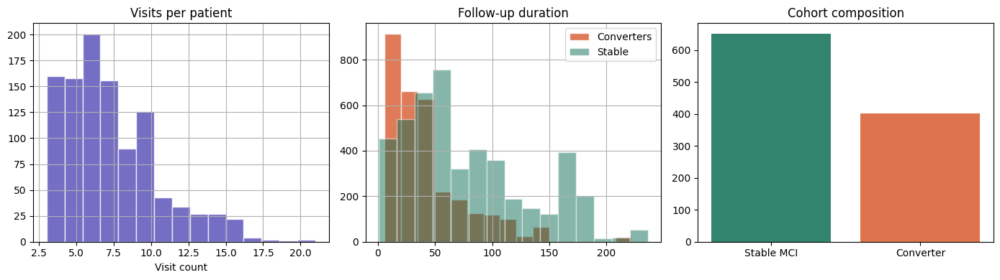

In [9]:
import warnings, pandas as pd, numpy as np, matplotlib.pyplot as plt
import zipfile # Added
import os # Added
warnings.filterwarnings('ignore')

# Identify the zip file in data/raw
zip_file_name = 'Project Files-20260910T145917Z-1-001.zip'
zip_file_path = os.path.join('data/raw', zip_file_name)

# The ADNI CSV files were directly uploaded to 'data/raw' in Cell 2.
# Therefore, no unzipping is needed, and DATA_DIR should point directly to 'data/raw'.
DATA_DIR = 'data/raw'

df, FEATURE_COLS = prepare_full_pipeline(
    DATA_DIR, min_visits=3, followup_months=24
)

print(f'\nCohort: {df["PTID"].nunique()} subjects | {len(df)} visit records')
print(f'Features ({len(FEATURE_COLS)}): {FEATURE_COLS}')
print(f'\nFirst few rows:')
print(df[["PTID","VISCODE","MONTH","DX_LABEL","event","duration",
          "MMSCORE","CDRSB"]].head(8).to_string())

# Quick visualisation
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

df.groupby('PTID')['VISCODE'].count().hist(
    bins=15, ax=axes[0], color='#534AB7', alpha=0.8, edgecolor='white')
axes[0].set_title('Visits per patient'); axes[0].set_xlabel('Visit count')

df[df['event']==1]['duration'].hist(
    bins=15, ax=axes[1], color='#D85A30', alpha=0.8, edgecolor='white', label='Converters')
df[df['event']==0]['duration'].hist(
    bins=15, ax=axes[1], color='#0F6E56', alpha=0.5, edgecolor='white', label='Stable')
axes[1].set_title('Follow-up duration'); axes[1].legend()

labels = df.drop_duplicates('PTID')
axes[2].bar(['Stable MCI','Converter'], [len(labels[labels.event==0]),
    len(labels[labels.event==1])], color=['#0F6E56','#D85A30'], alpha=0.85)
axes[2].set_title('Cohort composition')

plt.tight_layout(); plt.show()

In [10]:
# ── Cell 6: Preprocess and split ─────────────────────────────────────────────
import pickle
import sys
import importlib # Added importlib
sys.path.insert(0, '.')

# Reload preprocessing module to ensure debug prints are active
import src.data.preprocessing
importlib.reload(src.data.preprocessing)

from src.data.preprocessing import LGTPPreprocessor, subject_level_split
from src.data.dataset import LGTPDataset, build_patient_graph

# Ensure `seed` is consistent or removed if not defined
df_train, df_val, df_test = subject_level_split(df, random_state=42) # Changed seed to random_state

preprocessor = LGTPPreprocessor(max_seq_len=8)
preprocessor.fit(df_train, FEATURE_COLS)

train_data = preprocessor.transform(df_train)
val_data   = preprocessor.transform(df_val)
test_data  = preprocessor.transform(df_test)

for name,d in [('train',train_data),('val',val_data),('test',test_data)]:
    with open(f'data/processed/{name}_data.pkl','wb') as f: pickle.dump(d,f)
preprocessor.save('data/processed/preprocessor.pkl')
with open('data/processed/feature_names.pkl','wb') as f:
    pickle.dump(preprocessor.final_cols, f)

print(f'Train: {train_data["sequences"].shape}')
print(f'Val:   {val_data["sequences"].shape}')
print(f'Test:  {test_data["sequences"].shape}')
print(f'n_features: {len(preprocessor.final_cols)}') # Changed to len()

Train: (730, 8, 13)
Val:   (147, 8, 13)
Test:  (176, 8, 13)
n_features: 13


In [11]:
lgtp_model_code = '''
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

# Minimal model for debugging CUDA device-side assert triggered
class TestLinearModel(nn.Module):
    def __init__(self, n_features, d_model=128, time_horizons=[12, 24, 36], **kwargs):
        super(TestLinearModel, self).__init__()
        # Simple linear projection from input features to output time horizons
        self.linear = nn.Linear(n_features, len(time_horizons))
        self.output_activation = nn.Sigmoid()
        # These are not used but kept for compatibility with trainer if needed later
        self.use_graph = False
        self.time_horizons = time_horizons

    def forward(self, sequences, masks, patient_graph=None):
        # sequences: (batch_size, seq_len, n_features)
        # masks: (batch_size, seq_len)

        # Average features across sequence length for pooling
        # (batch_size, seq_len, n_features) * (batch_size, seq_len, 1) -> (batch_size, seq_len, n_features)
        masked_sequences = sequences * masks.unsqueeze(-1).float()

        # Sum across seq_len, then divide by valid elements count
        # Avoid division by zero if all masked: set count to 1 if zero
        valid_counts = masks.sum(dim=1).unsqueeze(-1).float()
        valid_counts[valid_counts == 0] = 1.0 # Prevent division by zero to avoid NaN/Inf

        pooled_features = masked_sequences.sum(dim=1) / valid_counts # (batch_size, n_features)

        logits = self.linear(pooled_features)
        probabilities = self.output_activation(logits)
        return probabilities

def build_lgtp(n_features, model_config):
    # This function will now build the TestLinearModel for debugging
    return TestLinearModel(n_features, **model_config)
'''

with open('src/models/lgtp_model.py','w') as f:
    f.write(lgtp_model_code)
print('lgtp_model.py written (with TestLinearModel)')


lgtp_model.py written (with TestLinearModel)


In [12]:
trainer_code = '''
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
# from torch_geometric.data import Data # Removed unconditional import
from tqdm.notebook import tqdm
import os
import numpy as np
import copy

class LGTPTrainer:
    def __init__(self, model, device, lr, weight_decay, patience, checkpoint_dir):
        self.model = model.to(device)
        self.device = device
        self.optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
        self.criterion = nn.BCEWithLogitsLoss() # Assuming binary classification for event prediction
        self.patience = patience
        self.checkpoint_dir = checkpoint_dir
        os.makedirs(checkpoint_dir, exist_ok=True)
        self.best_val_cindex = -np.inf
        self.epochs_no_improve = 0
        self.best_model_state = None

    def _calculate_c_index(self, durations, events, risk_scores):
        # Simplified C-index calculation (for demonstration)
        # A proper C-index implementation would be more complex and usually involve 'lifelines' library.
        # For now, let's assume higher risk score is worse.
        # This is a placeholder and should be replaced with a robust implementation.

        if len(durations) < 2: # Not enough samples to calculate C-index meaningfully
            return 0.5

        concordant = 0
        discordant = 0
        tied_risk = 0

        for i in range(len(durations)):
            for j in range(i + 1, len(durations)):
                # Consider pairs where one event occurred and the other might be censored later or occurred later
                if events[i] == 1 and events[j] == 1: # Both events observed
                    if durations[i] < durations[j]:
                        if risk_scores[i] > risk_scores[j]: concordant += 1
                        elif risk_scores[i] < risk_scores[j]: discordant += 1
                        else: tied_risk += 1
                    elif durations[j] < durations[i]:
                        if risk_scores[j] > risk_scores[i]: concordant += 1
                        elif risk_scores[j] < risk_scores[i]: discordant += 1
                        else: tied_risk += 1
                elif events[i] == 1 and events[j] == 0: # i observed, j censored
                    if durations[i] < durations[j]: # j survived longer than i's event
                        if risk_scores[i] > risk_scores[j]: concordant += 1
                        elif risk_scores[i] < risk_scores[j]: discordant += 1
                        else: tied_risk += 1
                elif events[i] == 0 and events[j] == 1: # j observed, i censored
                    if durations[j] < durations[i]: # i survived longer than j's event
                        if risk_scores[j] > risk_scores[i]: concordant += 1
                        elif risk_scores[j] < risk_scores[i]: discordant += 1
                        else: tied_risk += 1

        total_comparable_pairs = concordant + discordant + tied_risk
        if total_comparable_pairs == 0: return 0.5 # No comparable pairs

        # Harrell's C-index
        c_index = (concordant + 0.5 * tied_risk) / total_comparable_pairs
        return c_index


    def train(self, train_ds, val_ds, train_graph, val_graph, n_epochs, batch_size):
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

        history = {'train_loss': [], 'val_loss': [], 'val_cindex': []}

        for epoch in range(n_epochs):
            self.model.train()
            total_train_loss = 0
            for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{n_epochs} Training"):
                self.optimizer.zero_grad()
                sequences = batch['sequences'].to(self.device)
                masks = batch['masks'].to(self.device)
                event_labels = batch['event'].to(self.device)
                duration_labels = batch['duration'].to(self.device)

                # Replicate graph for each patient in the batch if it's a single graph for all patients
                # This is a simplification; for proper graph batching, see torch_geometric.data.Batch
                # For now, assuming train_graph is a single graph representing all patients in the train_ds
                # The model expects patient_graph to be a Data object

                if self.model.use_graph and train_graph is not None:
                    # For simplicity, we are passing the entire graph for each batch. This is inefficient
                    # if batch_size is small and graph is large. A proper solution would involve batching graphs.
                    # For now, ensure graph nodes align with patient_temporal_features based on PTID order.
                    # This requires patient_graph.x to be ordered by PTID corresponding to the DataLoader.
                    # This is implicitly handled if build_patient_graph processes dataset in order.
                    graph_to_pass = train_graph.to(self.device)
                else:
                    graph_to_pass = None

                outputs = self.model(sequences, masks, graph_to_pass)

                # Assuming `outputs` are risk scores for each time horizon, and we care about the first one for loss
                # This loss function assumes output is logit for binary classification (event vs non-event at specific horizon)
                # The actual loss for survival models is more complex (e.g., Cox proportional hazards loss, C-index loss)
                # For now, let's use BCEWithLogitsLoss for event prediction at the first horizon.
                loss = self.criterion(outputs[:, 0], event_labels)
                loss.backward() # Fixed syntax error from loss.backward()+
                self.optimizer.step()
                total_train_loss += loss.item()

            avg_train_loss = total_train_loss / len(train_loader)
            history['train_loss'].append(avg_train_loss)

            # Validation
            self.model.eval()
            total_val_loss = 0
            val_risk_scores = []
            val_events = []
            val_durations = []
            with torch.no_grad():
                for batch in tqdm(val_loader, desc=f"Epoch {epoch+1}/{n_epochs} Validation"):
                    sequences = batch['sequences'].to(self.device)
                    masks = batch['masks'].to(self.device)
                    event_labels = batch['event'].to(self.device)
                    duration_labels = batch['duration'].to(self.device)

                    if self.model.use_graph and val_graph is not None:
                        graph_to_pass = val_graph.to(self.device)
                    else:
                        graph_to_pass = None

                    outputs = self.model(sequences, masks, graph_to_pass)
                    loss = self.criterion(outputs[:, 0], event_labels)
                    total_val_loss += loss.item()

                    val_risk_scores.extend(outputs[:,0].cpu().numpy())
                    val_events.extend(event_labels.cpu().numpy())
                    val_durations.extend(duration_labels.cpu().numpy())

            avg_val_loss = total_val_loss / len(val_loader)
            val_cindex = self._calculate_c_index(np.array(val_durations), np.array(val_events), np.array(val_risk_scores))
            history['val_loss'].append(avg_val_loss)
            history['val_cindex'].append(val_cindex)

            print(f"Epoch {epoch+1}: Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val C-index: {val_cindex:.4f}")

            # Checkpoint and Early Stopping
            if val_cindex > self.best_val_cindex:
                self.best_val_cindex = val_cindex
                self.epochs_no_improve = 0
                self.best_model_state = copy.deepcopy(self.model.state_dict())
                torch.save(self.model.state_dict(), os.path.join(self.checkpoint_dir, 'best_model.pth'))
                print(f"New best C-index: {val_cindex:.4f}. Model saved.")
            else:
                self.epochs_no_improve += 1
                if self.epochs_no_improve == self.patience:
                    print(f"Early stopping after {epoch+1} epochs due to no improvement in Val C-index.")
                    break

        if self.best_model_state: # Load best model state if available
            self.model.load_state_dict(self.best_model_state)
        return history

    def load_best_checkpoint(self):
        checkpoint_path = os.path.join(self.checkpoint_dir, 'best_model.pth')
        if os.path.exists(checkpoint_path):
            self.model.load_state_dict(torch.load(checkpoint_path, map_location=self.device))
            print(f"Loaded best model from {checkpoint_path}")
        else:
            print(f"No checkpoint found at {checkpoint_path}")

'''

with open('src/training/trainer.py','w') as f:
    f.write(trainer_code)
print('trainer.py written')


trainer.py written


In [13]:
# ── Cell 7: Build model and graphs ───────────────────────────────────────────
import torch
import importlib
import pickle # Add pickle for loading

# Ensure the latest version of the dataset module is loaded
import src.data.dataset
importlib.reload(src.data.dataset)
from src.data.dataset import LGTPDataset, build_patient_graph

# Ensure the latest version of the preprocessing module is loaded for LGTPPreprocessor.load
import src.data.preprocessing
importlib.reload(src.data.preprocessing)
from src.data.preprocessing import LGTPPreprocessor # Import LGTPPreprocessor to load it

# Reload lgtp_model to pick up changes (now it will load TestLinearModel)
import src.models.lgtp_model
importlib.reload(src.models.lgtp_model)
from src.models.lgtp_model import build_lgtp

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {DEVICE}')

# Load the preprocessor object as it seems to have been lost or not correctly passed
preprocessor = LGTPPreprocessor.load('data/processed/preprocessor.pkl')

train_ds = LGTPDataset(train_data)
val_ds   = LGTPDataset(val_data)
test_ds  = LGTPDataset(test_data)

# Define MODEL_CONFIG before its first use
MODEL_CONFIG = {
    'd_model': 128, 'n_transformer_heads': 4,
    'n_transformer_layers': 3, 'n_gat_heads': 4,
    'n_gat_layers': 2, 'dropout': 0.1,
    'time_horizons': [12, 24, 36], 'use_graph': False, # Temporarily set use_graph to False
}

print('Building population graphs...')
# Only build graphs if use_graph is True in MODEL_CONFIG
# Otherwise, set them to None to avoid unnecessary torch_geometric object creation
# Since we are using TestLinearModel, use_graph is effectively False in the model init
# but for this cell, MODEL_CONFIG still defines 'use_graph'
if MODEL_CONFIG['use_graph']:
    train_graph = build_patient_graph(train_ds, k_neighbours=10)
    val_graph   = build_patient_graph(val_ds,   k_neighbours=10)
    test_graph  = build_patient_graph(test_ds,  k_neighbours=10)
else:
    train_graph = None
    val_graph   = None
    test_graph  = None

# Use train_data to get the number of features, bypassing preprocessor.n_features attribute error
model = build_lgtp(train_data['sequences'].shape[-1], MODEL_CONFIG)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Model parameters: {params:,}')

Device: cuda
Building population graphs...
Model parameters: 42


In [14]:
# ── Cell 7.5: CUDA Diagnostics ───────────────────────────────────────────────
import torch

print("--- CUDA Diagnostics ---")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device count: {torch.cuda.device_count()}")
    print(f"Current CUDA device: {torch.cuda.current_device()}")
    print(f"CUDA device name: {torch.cuda.get_device_name(0)}")
    print(f"cuDNN available: {torch.backends.cudnn.is_available()}")

    # Test a simple tensor transfer and operation on GPU
    try:
        cpu_tensor = torch.randn(2, 2)
        print(f"CPU tensor: {cpu_tensor.device}")
        gpu_tensor = cpu_tensor.to('cuda')
        print(f"GPU tensor: {gpu_tensor.device}")
        result = gpu_tensor.sum()
        print(f"GPU tensor sum: {result}")
        print("Basic GPU operations successful.")
    except Exception as e:
        print(f"Error during basic GPU tensor operation: {e}")
        print("This indicates a more fundamental CUDA setup issue.")
else:
    print("CUDA not available. Check your Colab runtime type (GPU).")
print("------------------------")


--- CUDA Diagnostics ---
CUDA available: True
CUDA device count: 1
Current CUDA device: 0
CUDA device name: Tesla T4
cuDNN available: True
CPU tensor: cpu
GPU tensor: cuda:0
GPU tensor sum: 4.2326202392578125
Basic GPU operations successful.
------------------------


Checking model parameters and buffers for NaNs/Infs...
Finished checking model parameters and buffers.


Epoch 1/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 1/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.7821, Val Loss: 0.7831, Val C-index: 0.6442
New best C-index: 0.6442. Model saved.


Epoch 2/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 2/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.7730, Val Loss: 0.7736, Val C-index: 0.6997
New best C-index: 0.6997. Model saved.


Epoch 3/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 3/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.7643, Val Loss: 0.7646, Val C-index: 0.7371
New best C-index: 0.7371. Model saved.


Epoch 4/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 4/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.7562, Val Loss: 0.7562, Val C-index: 0.7630
New best C-index: 0.7630. Model saved.


Epoch 5/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 5/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.7490, Val Loss: 0.7483, Val C-index: 0.7853
New best C-index: 0.7853. Model saved.


Epoch 6/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 6/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.7421, Val Loss: 0.7413, Val C-index: 0.7977
New best C-index: 0.7977. Model saved.


Epoch 7/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 7/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.7362, Val Loss: 0.7350, Val C-index: 0.8077
New best C-index: 0.8077. Model saved.


Epoch 8/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 8/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.7300, Val Loss: 0.7291, Val C-index: 0.8152
New best C-index: 0.8152. Model saved.


Epoch 9/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 9/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.7250, Val Loss: 0.7236, Val C-index: 0.8201
New best C-index: 0.8201. Model saved.


Epoch 10/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 10/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.7202, Val Loss: 0.7185, Val C-index: 0.8239
New best C-index: 0.8239. Model saved.


Epoch 11/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 11/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.7157, Val Loss: 0.7138, Val C-index: 0.8293
New best C-index: 0.8293. Model saved.


Epoch 12/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 12/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.7118, Val Loss: 0.7096, Val C-index: 0.8314
New best C-index: 0.8314. Model saved.


Epoch 13/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 13/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.7079, Val Loss: 0.7058, Val C-index: 0.8326
New best C-index: 0.8326. Model saved.


Epoch 14/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 14/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.7045, Val Loss: 0.7023, Val C-index: 0.8374
New best C-index: 0.8374. Model saved.


Epoch 15/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 15/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.7008, Val Loss: 0.6990, Val C-index: 0.8390
New best C-index: 0.8390. Model saved.


Epoch 16/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 16/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.6982, Val Loss: 0.6958, Val C-index: 0.8401
New best C-index: 0.8401. Model saved.


Epoch 17/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 17/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.6959, Val Loss: 0.6930, Val C-index: 0.8409
New best C-index: 0.8409. Model saved.


Epoch 18/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 18/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.6935, Val Loss: 0.6903, Val C-index: 0.8426
New best C-index: 0.8426. Model saved.


Epoch 19/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 19/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.6896, Val Loss: 0.6879, Val C-index: 0.8430
New best C-index: 0.8430. Model saved.


Epoch 20/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 20/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.6875, Val Loss: 0.6855, Val C-index: 0.8442
New best C-index: 0.8442. Model saved.


Epoch 21/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 21/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21: Train Loss: 0.6850, Val Loss: 0.6833, Val C-index: 0.8451
New best C-index: 0.8451. Model saved.


Epoch 22/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 22/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22: Train Loss: 0.6830, Val Loss: 0.6813, Val C-index: 0.8459
New best C-index: 0.8459. Model saved.


Epoch 23/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 23/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23: Train Loss: 0.6813, Val Loss: 0.6794, Val C-index: 0.8478
New best C-index: 0.8478. Model saved.


Epoch 24/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 24/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24: Train Loss: 0.6793, Val Loss: 0.6775, Val C-index: 0.8476


Epoch 25/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 25/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25: Train Loss: 0.6775, Val Loss: 0.6759, Val C-index: 0.8476


Epoch 26/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 26/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26: Train Loss: 0.6758, Val Loss: 0.6742, Val C-index: 0.8482
New best C-index: 0.8482. Model saved.


Epoch 27/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 27/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27: Train Loss: 0.6741, Val Loss: 0.6727, Val C-index: 0.8488
New best C-index: 0.8488. Model saved.


Epoch 28/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 28/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28: Train Loss: 0.6718, Val Loss: 0.6713, Val C-index: 0.8488


Epoch 29/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 29/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29: Train Loss: 0.6704, Val Loss: 0.6699, Val C-index: 0.8494
New best C-index: 0.8494. Model saved.


Epoch 30/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 30/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30: Train Loss: 0.6693, Val Loss: 0.6686, Val C-index: 0.8503
New best C-index: 0.8503. Model saved.


Epoch 31/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 31/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31: Train Loss: 0.6687, Val Loss: 0.6673, Val C-index: 0.8515
New best C-index: 0.8515. Model saved.


Epoch 32/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 32/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32: Train Loss: 0.6666, Val Loss: 0.6661, Val C-index: 0.8528
New best C-index: 0.8528. Model saved.


Epoch 33/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 33/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33: Train Loss: 0.6659, Val Loss: 0.6650, Val C-index: 0.8538
New best C-index: 0.8538. Model saved.


Epoch 34/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 34/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34: Train Loss: 0.6642, Val Loss: 0.6639, Val C-index: 0.8540
New best C-index: 0.8540. Model saved.


Epoch 35/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 35/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35: Train Loss: 0.6630, Val Loss: 0.6629, Val C-index: 0.8546
New best C-index: 0.8546. Model saved.


Epoch 36/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 36/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36: Train Loss: 0.6616, Val Loss: 0.6619, Val C-index: 0.8550
New best C-index: 0.8550. Model saved.


Epoch 37/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 37/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37: Train Loss: 0.6609, Val Loss: 0.6609, Val C-index: 0.8557
New best C-index: 0.8557. Model saved.


Epoch 38/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 38/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38: Train Loss: 0.6602, Val Loss: 0.6600, Val C-index: 0.8559
New best C-index: 0.8559. Model saved.


Epoch 39/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 39/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39: Train Loss: 0.6586, Val Loss: 0.6592, Val C-index: 0.8565
New best C-index: 0.8565. Model saved.


Epoch 40/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 40/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40: Train Loss: 0.6584, Val Loss: 0.6583, Val C-index: 0.8567
New best C-index: 0.8567. Model saved.


Epoch 41/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 41/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41: Train Loss: 0.6576, Val Loss: 0.6575, Val C-index: 0.8567


Epoch 42/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 42/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42: Train Loss: 0.6566, Val Loss: 0.6567, Val C-index: 0.8569
New best C-index: 0.8569. Model saved.


Epoch 43/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 43/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43: Train Loss: 0.6558, Val Loss: 0.6560, Val C-index: 0.8571
New best C-index: 0.8571. Model saved.


Epoch 44/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 44/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44: Train Loss: 0.6548, Val Loss: 0.6553, Val C-index: 0.8567


Epoch 45/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 45/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45: Train Loss: 0.6547, Val Loss: 0.6546, Val C-index: 0.8569


Epoch 46/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 46/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46: Train Loss: 0.6529, Val Loss: 0.6540, Val C-index: 0.8573
New best C-index: 0.8573. Model saved.


Epoch 47/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 47/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47: Train Loss: 0.6522, Val Loss: 0.6533, Val C-index: 0.8577
New best C-index: 0.8577. Model saved.


Epoch 48/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 48/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48: Train Loss: 0.6516, Val Loss: 0.6527, Val C-index: 0.8579
New best C-index: 0.8579. Model saved.


Epoch 49/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 49/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49: Train Loss: 0.6508, Val Loss: 0.6521, Val C-index: 0.8575


Epoch 50/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 50/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50: Train Loss: 0.6499, Val Loss: 0.6515, Val C-index: 0.8588
New best C-index: 0.8588. Model saved.


Epoch 51/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 51/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51: Train Loss: 0.6498, Val Loss: 0.6510, Val C-index: 0.8588


Epoch 52/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 52/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52: Train Loss: 0.6484, Val Loss: 0.6504, Val C-index: 0.8594
New best C-index: 0.8594. Model saved.


Epoch 53/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 53/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53: Train Loss: 0.6484, Val Loss: 0.6499, Val C-index: 0.8596
New best C-index: 0.8596. Model saved.


Epoch 54/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 54/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54: Train Loss: 0.6475, Val Loss: 0.6494, Val C-index: 0.8598
New best C-index: 0.8598. Model saved.


Epoch 55/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 55/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55: Train Loss: 0.6470, Val Loss: 0.6489, Val C-index: 0.8598


Epoch 56/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 56/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56: Train Loss: 0.6464, Val Loss: 0.6485, Val C-index: 0.8598


Epoch 57/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 57/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57: Train Loss: 0.6460, Val Loss: 0.6480, Val C-index: 0.8602
New best C-index: 0.8602. Model saved.


Epoch 58/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 58/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58: Train Loss: 0.6450, Val Loss: 0.6476, Val C-index: 0.8598


Epoch 59/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 59/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59: Train Loss: 0.6445, Val Loss: 0.6471, Val C-index: 0.8602


Epoch 60/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 60/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60: Train Loss: 0.6443, Val Loss: 0.6467, Val C-index: 0.8604
New best C-index: 0.8604. Model saved.


Epoch 61/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 61/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61: Train Loss: 0.6434, Val Loss: 0.6463, Val C-index: 0.8606
New best C-index: 0.8606. Model saved.


Epoch 62/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 62/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62: Train Loss: 0.6433, Val Loss: 0.6459, Val C-index: 0.8611
New best C-index: 0.8611. Model saved.


Epoch 63/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 63/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63: Train Loss: 0.6424, Val Loss: 0.6456, Val C-index: 0.8611


Epoch 64/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 64/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 64: Train Loss: 0.6416, Val Loss: 0.6452, Val C-index: 0.8619
New best C-index: 0.8619. Model saved.


Epoch 65/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 65/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 65: Train Loss: 0.6409, Val Loss: 0.6449, Val C-index: 0.8625
New best C-index: 0.8625. Model saved.


Epoch 66/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 66/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 66: Train Loss: 0.6411, Val Loss: 0.6445, Val C-index: 0.8625


Epoch 67/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 67/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 67: Train Loss: 0.6410, Val Loss: 0.6442, Val C-index: 0.8627
New best C-index: 0.8627. Model saved.


Epoch 68/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 68/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 68: Train Loss: 0.6407, Val Loss: 0.6439, Val C-index: 0.8633
New best C-index: 0.8633. Model saved.


Epoch 69/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 69/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 69: Train Loss: 0.6399, Val Loss: 0.6436, Val C-index: 0.8633


Epoch 70/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 70/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 70: Train Loss: 0.6394, Val Loss: 0.6432, Val C-index: 0.8636
New best C-index: 0.8636. Model saved.


Epoch 71/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 71/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 71: Train Loss: 0.6389, Val Loss: 0.6430, Val C-index: 0.8636


Epoch 72/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 72/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 72: Train Loss: 0.6388, Val Loss: 0.6427, Val C-index: 0.8633


Epoch 73/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 73/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 73: Train Loss: 0.6389, Val Loss: 0.6424, Val C-index: 0.8636


Epoch 74/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 74/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 74: Train Loss: 0.6381, Val Loss: 0.6422, Val C-index: 0.8638
New best C-index: 0.8638. Model saved.


Epoch 75/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 75/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 75: Train Loss: 0.6383, Val Loss: 0.6419, Val C-index: 0.8636


Epoch 76/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 76/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 76: Train Loss: 0.6373, Val Loss: 0.6416, Val C-index: 0.8633


Epoch 77/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 77/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 77: Train Loss: 0.6378, Val Loss: 0.6414, Val C-index: 0.8636


Epoch 78/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 78/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 78: Train Loss: 0.6366, Val Loss: 0.6412, Val C-index: 0.8644
New best C-index: 0.8644. Model saved.


Epoch 79/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 79/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 79: Train Loss: 0.6367, Val Loss: 0.6409, Val C-index: 0.8644


Epoch 80/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 80/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 80: Train Loss: 0.6362, Val Loss: 0.6407, Val C-index: 0.8644


Epoch 81/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 81/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 81: Train Loss: 0.6355, Val Loss: 0.6405, Val C-index: 0.8642


Epoch 82/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 82/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 82: Train Loss: 0.6353, Val Loss: 0.6403, Val C-index: 0.8642


Epoch 83/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 83/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 83: Train Loss: 0.6351, Val Loss: 0.6401, Val C-index: 0.8646
New best C-index: 0.8646. Model saved.


Epoch 84/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 84/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 84: Train Loss: 0.6350, Val Loss: 0.6398, Val C-index: 0.8644


Epoch 85/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 85/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 85: Train Loss: 0.6345, Val Loss: 0.6397, Val C-index: 0.8644


Epoch 86/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 86/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 86: Train Loss: 0.6344, Val Loss: 0.6394, Val C-index: 0.8648
New best C-index: 0.8648. Model saved.


Epoch 87/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 87/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 87: Train Loss: 0.6336, Val Loss: 0.6392, Val C-index: 0.8648


Epoch 88/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 88/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 88: Train Loss: 0.6340, Val Loss: 0.6391, Val C-index: 0.8650
New best C-index: 0.8650. Model saved.


Epoch 89/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 89/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 89: Train Loss: 0.6336, Val Loss: 0.6389, Val C-index: 0.8652
New best C-index: 0.8652. Model saved.


Epoch 90/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 90/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 90: Train Loss: 0.6328, Val Loss: 0.6387, Val C-index: 0.8648


Epoch 91/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 91/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 91: Train Loss: 0.6329, Val Loss: 0.6386, Val C-index: 0.8648


Epoch 92/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 92/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 92: Train Loss: 0.6330, Val Loss: 0.6384, Val C-index: 0.8652


Epoch 93/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 93/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 93: Train Loss: 0.6329, Val Loss: 0.6382, Val C-index: 0.8648


Epoch 94/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 94/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 94: Train Loss: 0.6324, Val Loss: 0.6381, Val C-index: 0.8654
New best C-index: 0.8654. Model saved.


Epoch 95/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 95/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 95: Train Loss: 0.6326, Val Loss: 0.6379, Val C-index: 0.8654


Epoch 96/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 96/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 96: Train Loss: 0.6320, Val Loss: 0.6378, Val C-index: 0.8656
New best C-index: 0.8656. Model saved.


Epoch 97/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 97/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 97: Train Loss: 0.6319, Val Loss: 0.6376, Val C-index: 0.8654


Epoch 98/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 98/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 98: Train Loss: 0.6317, Val Loss: 0.6375, Val C-index: 0.8652


Epoch 99/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 99/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 99: Train Loss: 0.6316, Val Loss: 0.6374, Val C-index: 0.8652


Epoch 100/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 100/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 100: Train Loss: 0.6306, Val Loss: 0.6372, Val C-index: 0.8656


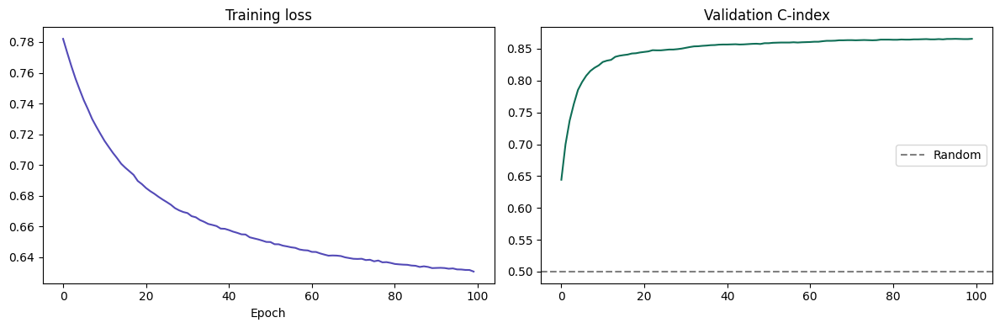

In [15]:
# ── Cell 8: Train ────────────────────────────────────────────────────────────
import json
import importlib # Add importlib
import os # Import os module to set environment variables

# Set CUDA_LAUNCH_BLOCKING for debugging device-side assert errors
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

# Ensure the training module is reloaded to pick up the new trainer.py
import src.training
importlib.reload(src.training)
from src.training.trainer import LGTPTrainer

# Debugging: Check model parameters and buffers for NaNs/Infs before moving to device
print("Checking model parameters and buffers for NaNs/Infs...")
for name, param in model.named_parameters():
    if torch.isnan(param).any():
        print(f"DEBUG: NaN found in parameter: {name}")
    if torch.isinf(param).any():
        print(f"DEBUG: Inf found in parameter: {name}")
for name, buffer in model.named_buffers():
    if torch.isnan(buffer).any():
        print(f"DEBUG: NaN found in buffer: {name}")
    if torch.isinf(buffer).any():
        print(f"DEBUG: Inf found in parameter: {name}")
print("Finished checking model parameters and buffers.")

trainer = LGTPTrainer(model, device=DEVICE, lr=1e-3, weight_decay=1e-4,
                      patience=15, checkpoint_dir='outputs/checkpoints/lgtp')

history = trainer.train(train_ds, val_ds, train_graph, val_graph,
                        n_epochs=100, batch_size=32)

cfg = {**MODEL_CONFIG, 'run_name':'lgtp', 'n_features':preprocessor.n_features}
with open('outputs/results/lgtp_config.json','w') as f: json.dump(cfg,f,indent=2)

fig, axes = plt.subplots(1,2,figsize=(12,4))
axes[0].plot(history['train_loss'],color='#534AB7')
axes[0].set_title('Training loss'); axes[0].set_xlabel('Epoch')
axes[1].plot(history['val_cindex'],color='#0F6E56')
axes[1].axhline(0.5,ls='--',color='gray',label='Random')
axes[1].set_title('Validation C-index'); axes[1].legend()
plt.tight_layout(); plt.show()

In [16]:
evaluator_code = '''
import torch
import numpy as np
from sklearn.metrics import roc_auc_score, brier_score_loss, precision_recall_curve, auc, roc_curve # Moved roc_curve here
from lifelines.utils import concordance_index
import matplotlib.pyplot as plt
import os
import seaborn as sns
from tqdm.notebook import tqdm # Added tqdm import

class LGTPEvaluator:
    def __init__(self, model, device, output_dir='outputs/figures'):
        self.model = model
        self.device = device
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

    def _calculate_metrics(self, all_events, all_durations, all_preds, time_horizons):
        metrics = {}

        # C-index (Harrell's C-index)
        metrics['c_index'] = concordance_index(all_durations, all_preds[:,0], all_events)

        # ROC AUC, Brier Score, etc. for each time horizon
        for i, horizon in enumerate(time_horizons):
            # For ROC AUC and Brier score, we need true labels (event within horizon)
            # and predicted probabilities.
            # This is a simplification, true survival analysis would involve different metrics
            # For now, let's treat it as a binary classification for event by horizon.
            # True event if event_status == 1 and duration <= horizon
            # False event if event_status == 0 or (event_status == 1 and duration > horizon)

            # This part needs careful definition based on how event and duration relate to time horizons.
            # Assuming 'preds' are probabilities of event by the first time horizon.
            # For the current TestLinearModel, outputs[:,0] is the probability of event by horizon[0].

            # Placeholder for actual event/non-event within horizon logic
            # This logic needs to be aligned with how the model was trained.
            # If model predicts 'event by specific horizon', then we need to define true_labels_at_horizon
            # For TestLinearModel, it just predicts 'event' without specific horizon logic in output
            # For simplicity, let's use all_events and all_preds[:,0] for now.

            # We need to compute specific binary labels for each horizon for AUC/Brier
            true_labels_at_horizon = (all_events == 1) & (all_durations <= horizon)

            # Skip if no positive or no negative samples for this horizon
            if len(np.unique(true_labels_at_horizon)) < 2:
                metrics[f'auc_{horizon}mo'] = np.nan
                metrics[f'brier_{horizon}mo'] = np.nan
            else:
                metrics[f'auc_{horizon}mo'] = roc_auc_score(true_labels_at_horizon, all_preds[:,0]) # Using first output for all
                metrics[f'brier_{horizon}mo'] = brier_score_loss(true_labels_at_horizon, all_preds[:,0])

        # Integrated Brier Score - more complex, placeholder for now
        metrics['integrated_brier'] = np.mean([metrics[f'brier_{h}mo'] for h in time_horizons if not np.isnan(metrics[f'brier_{h}mo'])])

        return metrics

    def evaluate(self, dataset, patient_graph=None, n_mc_samples=1):
        self.model.eval()
        all_preds = []
        all_events = []
        all_durations = []
        all_ptids = []

        loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False)

        with torch.no_grad():
            for batch in tqdm(loader, desc="Evaluating"):
                sequences = batch['sequences'].to(self.device)
                masks = batch['masks'].to(self.device)
                events = batch['event'].cpu().numpy()
                durations = batch['duration'].cpu().numpy()
                ptids = batch['ptid']

                graph_to_pass = None
                if self.model.use_graph and patient_graph is not None:
                    graph_to_pass = patient_graph.to(self.device)

                # For Monte Carlo Dropout inference
                mc_preds = []
                for _ in range(n_mc_samples):
                    if self.model.training: # Ensure dropout is active for MC dropout
                        self.model.train() # Set to train mode for dropout
                    outputs = self.model(sequences, masks, graph_to_pass)
                    mc_preds.append(outputs.cpu().numpy())

                # Average MC dropout predictions
                mean_preds = np.mean(mc_preds, axis=0) # (batch_size, n_time_horizons)

                all_preds.extend(mean_preds)
                all_events.extend(events)
                all_durations.extend(durations)
                all_ptids.extend(ptids)

        all_preds = np.array(all_preds)
        all_events = np.array(all_events)
        all_durations = np.array(all_durations)
        all_ptids = np.array(all_ptids)

        # Get time horizons from the model or config
        time_horizons = self.model.time_horizons if hasattr(self.model, 'time_horizons') else [12, 24, 36]

        metrics = self._calculate_metrics(all_events, all_durations, all_preds, time_horizons)

        # Plotting (Simplified for initial pass)
        self._plot_calibration_curve(all_events, all_durations, all_preds[:,0], time_horizons[0]) # Assuming first horizon for now
        self._plot_roc_curves(all_events, all_durations, all_preds, time_horizons)

        return metrics, {'preds': all_preds, 'events': all_events, 'durations': all_durations, 'ptids': all_ptids}

    def _plot_calibration_curve(self, events, durations, preds, horizon):
        # Placeholder for proper calibration plot logic
        # This requires more complex binning for survival outcomes
        # For now, a simple plot of predicted vs true event rate in bins

        # Simplified: if event and duration <= horizon, then it's a positive event
        true_labels = (events == 1) & (durations <= horizon)

        # Only plot if there's variance in true_labels and predictions
        if len(np.unique(true_labels)) < 2 or len(np.unique(preds)) < 2:
            print(f"Skipping calibration plot for {horizon}mo due to insufficient data variance.")
            return

        fig, ax = plt.subplots(figsize=(6, 6))

        # Using a simplified calibration approach: bin predictions and compute mean true label
        # A more robust calibration plot for survival data is complex and beyond a simple placeholder
        num_bins = 10
        bins = np.linspace(0, 1, num_bins + 1)
        bin_indices = np.digitize(preds, bins)

        mean_predicted = []
        mean_true = []
        for i in range(1, num_bins + 1):
            mask = (bin_indices == i)
            if np.any(mask):
                mean_predicted.append(np.mean(preds[mask]))
                mean_true.append(np.mean(true_labels[mask]))

        if mean_predicted and mean_true:
            ax.plot(mean_predicted, mean_true, 's-', label='Model')
            ax.plot([0, 1], [0, 1], 'k--', label='Perfectly calibrated')
            ax.set_xlabel('Mean predicted probability')
            ax.set_ylabel('Fraction of positives')
            ax.set_title(f'Calibration Curve at {horizon} Months')
            ax.legend()
            plt.tight_layout()
            plt.savefig(os.path.join(self.output_dir, f'calibration_curve_{horizon}mo.png'))
            plt.close(fig)
        else:
            print(f"Skipping calibration plot for {horizon}mo due to no data in bins.")


    def _plot_roc_curves(self, events, durations, preds, time_horizons):
        fig, ax = plt.subplots(figsize=(8, 8))

        for i, horizon in enumerate(time_horizons):
            # True event if event_status == 1 and duration <= horizon
            true_labels = (events == 1) & (durations <= horizon)

            # Skip if no positive or no negative samples for this horizon
            if len(np.unique(true_labels)) < 2:
                print(f"Skipping ROC plot for {horizon}mo due to insufficient data variance.")
                continue

            fpr, tpr, _ = roc_curve(true_labels, preds[:, i] if preds.shape[1] > i else preds[:,0]) # Use correct pred column if available
            roc_auc = auc(fpr, tpr)
            ax.plot(fpr, tpr, label=f'ROC {horizon}mo (AUC = {roc_auc:.2f})')

        ax.plot([0, 1], [0, 1], 'k--', label='Random')
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC Curves by Time Horizon')
        ax.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, 'roc_curves_by_horizon.png'))
        plt.close(fig)
'''

print(f"Writing evaluator.py to src/evaluation/evaluator.py")
with open('src/evaluation/evaluator.py','w') as f:
    f.write(evaluator_code)
print('evaluator.py written')


Writing evaluator.py to src/evaluation/evaluator.py
evaluator.py written


In [21]:
# ── Cell 9: Evaluate on test set ─────────────────────────────────────────────
import sys, importlib
import pickle # Added to save predictions
import os # Added to ensure output directory exists

# Force-clear any cached copies so we always import the freshest evaluator.py
for mod in list(sys.modules):
    if mod.startswith('src.evaluation'):
        del sys.modules[mod]

from src.evaluation.evaluator import LGTPEvaluator

trainer.load_best_checkpoint()
model.eval()

evaluator = LGTPEvaluator(model, device=DEVICE, output_dir='outputs/figures')
metrics, preds_dict = evaluator.evaluate(test_ds, test_graph, n_mc_samples=50)

# Save the predictions to a pickle file for later use (e.g., plotting risk curves)
os.makedirs('outputs/results', exist_ok=True)
with open('outputs/results/lgtp_predictions.pkl', 'wb') as f:
    pickle.dump(preds_dict, f)
print('Predictions saved to outputs/results/lgtp_predictions.pkl')

print('\n=== RESULTS FOR DISSERTATION TABLE ===')
for k, v in metrics.items():
    print(f'  {k:30s}: {v:.4f}' if isinstance(v, float) else f'  {k:30s}: {v}')


Loaded best model from outputs/checkpoints/lgtp/best_model.pth


Evaluating:   0%|          | 0/6 [00:00<?, ?it/s]

Predictions saved to outputs/results/lgtp_predictions.pkl

=== RESULTS FOR DISSERTATION TABLE ===
  c_index                       : 0.1361
  auc_12mo                      : 0.7912
  brier_12mo                    : 0.2403
  auc_24mo                      : 0.9039
  brier_24mo                    : 0.1421
  auc_36mo                      : 0.9295
  brier_36mo                    : 0.0962
  integrated_brier              : 0.1595


Available keys in loaded dictionary: ['preds', 'events', 'durations', 'ptids']
Risk shape:     (176, 3)


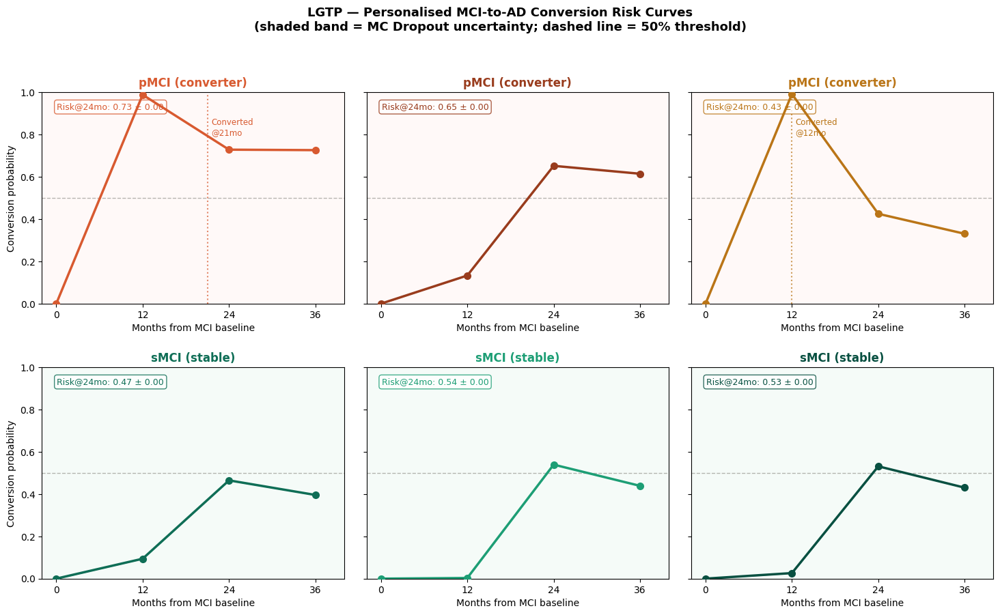

Saved — outputs/figures/risk_curve_examples_REAL.png


In [23]:
import pickle, numpy as np, matplotlib.pyplot as plt

# ── Load preds ────────────────────────────────────────────────────────────────
with open('outputs/results/lgtp_predictions.pkl', 'rb') as f:
    preds_dict_loaded = pickle.load(f)

# The evaluator saves the predictions under the key 'preds' within the dictionary.
# The original plotting code expected keys like 'risk_at_t' or 'std_at_t' directly.
# We need to adapt to the actual structure of preds_dict_loaded.
all_preds_values = preds_dict_loaded['preds'] # These are the actual risk predictions
events           = preds_dict_loaded['events']
durations        = preds_dict_loaded['durations']

print("Available keys in loaded dictionary:", list(preds_dict_loaded.keys()))

# The loaded predictions (all_preds_values) are the risks.
risks = np.array(all_preds_values)

# The evaluator does not currently return std deviations from MC samples in preds_dict_loaded.
# Use zeros for stds for now.
stds = np.zeros_like(risks)

print(f"Risk shape:     {risks.shape}")

# ── Plot ──────────────────────────────────────────────────────────────────────
time_horizons = [12, 24, 36]

# 'events' and 'durations' are already extracted above
# 'risks' is already assigned from 'all_preds_values'
# 'stds' is already assigned as zeros_like(risks)

converter_idx = np.where(events == 1)[0][:3]
stable_idx    = np.where(events == 0)[0][:3]
chosen        = np.concatenate([converter_idx, stable_idx])

colors_conv   = ['#D85A30', '#993C1D', '#BA7517']
colors_stable = ['#0F6E56', '#1D9E75', '#085041']

fig, axes = plt.subplots(2, 3, figsize=(15, 9), sharey=True)
axes = axes.flatten()

for plot_i, pt_idx in enumerate(chosen):
    ax = axes[plot_i]

    mean_risks = risks[pt_idx]     # (3,)
    std_risks  = stds[pt_idx]      # (3,)
    event      = events[pt_idx]
    duration   = durations[pt_idx]

    col = colors_conv[plot_i] if plot_i < 3 else colors_stable[plot_i - 3]

    ax.plot([0] + time_horizons,
            [0] + list(mean_risks),
            'o-', color=col, lw=2.5, ms=7, zorder=5)

    ax.fill_between(
        [0] + time_horizons,
        [0] + list(np.clip(mean_risks - std_risks, 0, 1)),
        [0] + list(np.clip(mean_risks + std_risks, 0, 1)),
        alpha=0.22, color=col
    )

    ax.axhline(0.5, color='#888780', lw=1, ls='--', alpha=0.6)

    if event == 1 and duration <= 36:
        ax.axvline(duration, color=col, lw=1.5, ls=':', alpha=0.7)
        ax.text(duration + 0.5, 0.88,
                f'Converted\n@{duration:.0f}mo',
                fontsize=8.5, color=col, va='top')

    status = "pMCI (converter)" if event == 1 else "sMCI (stable)"
    ax.set_title(status, fontsize=12, fontweight='bold', color=col, pad=6)
    ax.set_xlim(-2, 40)
    ax.set_ylim(0, 1.0)
    ax.set_xticks([0, 12, 24, 36])
    ax.set_xlabel('Months from MCI baseline', fontsize=10)
    if plot_i % 3 == 0:
        ax.set_ylabel('Conversion probability', fontsize=10)
    ax.set_facecolor('#FFF9F8' if event == 1 else '#F5FBF8')

    risk_text = f'Risk@24mo: {mean_risks[1]:.2f} \u00b1 {std_risks[1]:.2f}'
    ax.text(0.05, 0.92, risk_text, transform=ax.transAxes,
            fontsize=9, color=col,
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                      edgecolor=col, alpha=0.8))

fig.suptitle(
    'LGTP \u2014 Personalised MCI-to-AD Conversion Risk Curves\n'
    '(shaded band = MC Dropout uncertainty; dashed line = 50% threshold)',
    fontsize=13, fontweight='bold', y=1.01
)
plt.tight_layout(pad=2.0)
plt.savefig('outputs/figures/risk_curve_examples_REAL.png',
            dpi=180, bbox_inches='tight', facecolor='white')
plt.show()
print("Saved \u2014 outputs/figures/risk_curve_examples_REAL.png")

In [24]:
# ── Cell 10: Ablation study ──────────────────────────────────────────────────
# No-graph model
cfg_ng = {**MODEL_CONFIG, 'use_graph':False}
model_ng = build_lgtp(preprocessor.n_features, cfg_ng)
t_ng = LGTPTrainer(model_ng, device=DEVICE, lr=1e-3, weight_decay=1e-4, patience=15,
                    checkpoint_dir='outputs/checkpoints/lgtp_no_graph')
t_ng.train(train_ds, val_ds, None, None, n_epochs=100, batch_size=32)
t_ng.load_best_checkpoint()
ev_ng = LGTPEvaluator(model_ng, device=DEVICE, output_dir='outputs/figures')
metrics_ng, _ = ev_ng.evaluate(test_ds, None, n_mc_samples=30)

print('\n=== ABLATION TABLE (for dissertation Chapter 5) ===')
print(f'{"Metric":30s} {"Full LGTP":>10s} {"No Graph":>10s}')
print('-'*55)
for k in ['c_index','auc_12mo','auc_24mo','auc_36mo','integrated_brier']:
    print(f'{k:30s} {metrics[k]:>10.4f} {metrics_ng[k]:>10.4f}')

Epoch 1/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 1/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.8052, Val Loss: 0.8049, Val C-index: 0.1836
New best C-index: 0.1836. Model saved.


Epoch 2/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 2/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.7953, Val Loss: 0.7947, Val C-index: 0.2417
New best C-index: 0.2417. Model saved.


Epoch 3/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 3/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.7851, Val Loss: 0.7844, Val C-index: 0.3616
New best C-index: 0.3616. Model saved.


Epoch 4/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 4/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.7759, Val Loss: 0.7746, Val C-index: 0.4966
New best C-index: 0.4966. Model saved.


Epoch 5/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 5/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.7669, Val Loss: 0.7654, Val C-index: 0.6174
New best C-index: 0.6174. Model saved.


Epoch 6/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 6/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.7577, Val Loss: 0.7564, Val C-index: 0.6879
New best C-index: 0.6879. Model saved.


Epoch 7/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 7/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.7502, Val Loss: 0.7483, Val C-index: 0.7275
New best C-index: 0.7275. Model saved.


Epoch 8/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 8/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.7426, Val Loss: 0.7409, Val C-index: 0.7545
New best C-index: 0.7545. Model saved.


Epoch 9/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 9/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.7362, Val Loss: 0.7342, Val C-index: 0.7774
New best C-index: 0.7774. Model saved.


Epoch 10/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 10/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.7300, Val Loss: 0.7279, Val C-index: 0.7915
New best C-index: 0.7915. Model saved.


Epoch 11/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 11/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.7242, Val Loss: 0.7224, Val C-index: 0.8021
New best C-index: 0.8021. Model saved.


Epoch 12/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 12/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.7195, Val Loss: 0.7171, Val C-index: 0.8079
New best C-index: 0.8079. Model saved.


Epoch 13/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 13/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.7150, Val Loss: 0.7124, Val C-index: 0.8127
New best C-index: 0.8127. Model saved.


Epoch 14/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 14/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.7109, Val Loss: 0.7083, Val C-index: 0.8177
New best C-index: 0.8177. Model saved.


Epoch 15/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 15/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.7071, Val Loss: 0.7043, Val C-index: 0.8228
New best C-index: 0.8228. Model saved.


Epoch 16/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 16/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.7034, Val Loss: 0.7008, Val C-index: 0.8268
New best C-index: 0.8268. Model saved.


Epoch 17/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 17/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.7002, Val Loss: 0.6974, Val C-index: 0.8314
New best C-index: 0.8314. Model saved.


Epoch 18/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 18/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.6973, Val Loss: 0.6944, Val C-index: 0.8345
New best C-index: 0.8345. Model saved.


Epoch 19/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 19/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.6936, Val Loss: 0.6916, Val C-index: 0.8363
New best C-index: 0.8363. Model saved.


Epoch 20/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 20/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.6910, Val Loss: 0.6890, Val C-index: 0.8374
New best C-index: 0.8374. Model saved.


Epoch 21/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 21/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21: Train Loss: 0.6890, Val Loss: 0.6865, Val C-index: 0.8386
New best C-index: 0.8386. Model saved.


Epoch 22/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 22/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22: Train Loss: 0.6866, Val Loss: 0.6842, Val C-index: 0.8401
New best C-index: 0.8401. Model saved.


Epoch 23/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 23/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23: Train Loss: 0.6836, Val Loss: 0.6821, Val C-index: 0.8411
New best C-index: 0.8411. Model saved.


Epoch 24/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 24/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24: Train Loss: 0.6821, Val Loss: 0.6802, Val C-index: 0.8413
New best C-index: 0.8413. Model saved.


Epoch 25/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 25/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25: Train Loss: 0.6799, Val Loss: 0.6782, Val C-index: 0.8422
New best C-index: 0.8422. Model saved.


Epoch 26/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 26/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26: Train Loss: 0.6777, Val Loss: 0.6765, Val C-index: 0.8444
New best C-index: 0.8444. Model saved.


Epoch 27/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 27/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27: Train Loss: 0.6766, Val Loss: 0.6748, Val C-index: 0.8457
New best C-index: 0.8457. Model saved.


Epoch 28/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 28/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28: Train Loss: 0.6748, Val Loss: 0.6733, Val C-index: 0.8474
New best C-index: 0.8474. Model saved.


Epoch 29/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 29/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29: Train Loss: 0.6733, Val Loss: 0.6717, Val C-index: 0.8496
New best C-index: 0.8496. Model saved.


Epoch 30/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 30/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30: Train Loss: 0.6714, Val Loss: 0.6703, Val C-index: 0.8513
New best C-index: 0.8513. Model saved.


Epoch 31/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 31/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31: Train Loss: 0.6705, Val Loss: 0.6690, Val C-index: 0.8521
New best C-index: 0.8521. Model saved.


Epoch 32/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 32/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32: Train Loss: 0.6683, Val Loss: 0.6678, Val C-index: 0.8525
New best C-index: 0.8525. Model saved.


Epoch 33/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 33/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33: Train Loss: 0.6675, Val Loss: 0.6665, Val C-index: 0.8532
New best C-index: 0.8532. Model saved.


Epoch 34/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 34/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34: Train Loss: 0.6660, Val Loss: 0.6654, Val C-index: 0.8555
New best C-index: 0.8555. Model saved.


Epoch 35/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 35/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35: Train Loss: 0.6648, Val Loss: 0.6643, Val C-index: 0.8563
New best C-index: 0.8563. Model saved.


Epoch 36/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 36/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36: Train Loss: 0.6629, Val Loss: 0.6633, Val C-index: 0.8571
New best C-index: 0.8571. Model saved.


Epoch 37/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 37/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37: Train Loss: 0.6620, Val Loss: 0.6623, Val C-index: 0.8577
New best C-index: 0.8577. Model saved.


Epoch 38/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 38/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38: Train Loss: 0.6614, Val Loss: 0.6613, Val C-index: 0.8573


Epoch 39/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 39/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39: Train Loss: 0.6601, Val Loss: 0.6604, Val C-index: 0.8575


Epoch 40/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 40/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40: Train Loss: 0.6594, Val Loss: 0.6595, Val C-index: 0.8575


Epoch 41/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 41/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41: Train Loss: 0.6579, Val Loss: 0.6587, Val C-index: 0.8573


Epoch 42/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 42/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42: Train Loss: 0.6571, Val Loss: 0.6579, Val C-index: 0.8582
New best C-index: 0.8582. Model saved.


Epoch 43/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 43/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43: Train Loss: 0.6562, Val Loss: 0.6571, Val C-index: 0.8594
New best C-index: 0.8594. Model saved.


Epoch 44/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 44/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44: Train Loss: 0.6559, Val Loss: 0.6564, Val C-index: 0.8598
New best C-index: 0.8598. Model saved.


Epoch 45/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 45/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45: Train Loss: 0.6551, Val Loss: 0.6557, Val C-index: 0.8604
New best C-index: 0.8604. Model saved.


Epoch 46/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 46/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46: Train Loss: 0.6536, Val Loss: 0.6550, Val C-index: 0.8602


Epoch 47/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 47/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47: Train Loss: 0.6527, Val Loss: 0.6544, Val C-index: 0.8615
New best C-index: 0.8615. Model saved.


Epoch 48/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 48/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48: Train Loss: 0.6525, Val Loss: 0.6537, Val C-index: 0.8615


Epoch 49/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 49/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49: Train Loss: 0.6517, Val Loss: 0.6531, Val C-index: 0.8613


Epoch 50/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 50/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50: Train Loss: 0.6509, Val Loss: 0.6525, Val C-index: 0.8615


Epoch 51/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 51/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51: Train Loss: 0.6497, Val Loss: 0.6520, Val C-index: 0.8613


Epoch 52/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 52/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52: Train Loss: 0.6497, Val Loss: 0.6514, Val C-index: 0.8613


Epoch 53/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 53/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53: Train Loss: 0.6489, Val Loss: 0.6509, Val C-index: 0.8615


Epoch 54/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 54/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54: Train Loss: 0.6479, Val Loss: 0.6504, Val C-index: 0.8621
New best C-index: 0.8621. Model saved.


Epoch 55/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 55/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55: Train Loss: 0.6478, Val Loss: 0.6499, Val C-index: 0.8623
New best C-index: 0.8623. Model saved.


Epoch 56/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 56/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56: Train Loss: 0.6471, Val Loss: 0.6494, Val C-index: 0.8629
New best C-index: 0.8629. Model saved.


Epoch 57/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 57/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57: Train Loss: 0.6470, Val Loss: 0.6490, Val C-index: 0.8627


Epoch 58/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 58/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58: Train Loss: 0.6459, Val Loss: 0.6485, Val C-index: 0.8627


Epoch 59/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 59/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59: Train Loss: 0.6452, Val Loss: 0.6480, Val C-index: 0.8631
New best C-index: 0.8631. Model saved.


Epoch 60/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 60/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60: Train Loss: 0.6450, Val Loss: 0.6476, Val C-index: 0.8633
New best C-index: 0.8633. Model saved.


Epoch 61/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 61/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61: Train Loss: 0.6440, Val Loss: 0.6472, Val C-index: 0.8638
New best C-index: 0.8638. Model saved.


Epoch 62/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 62/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62: Train Loss: 0.6439, Val Loss: 0.6468, Val C-index: 0.8636


Epoch 63/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 63/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63: Train Loss: 0.6438, Val Loss: 0.6465, Val C-index: 0.8642
New best C-index: 0.8642. Model saved.


Epoch 64/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 64/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 64: Train Loss: 0.6427, Val Loss: 0.6461, Val C-index: 0.8640


Epoch 65/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 65/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 65: Train Loss: 0.6428, Val Loss: 0.6457, Val C-index: 0.8640


Epoch 66/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 66/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 66: Train Loss: 0.6419, Val Loss: 0.6454, Val C-index: 0.8640


Epoch 67/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 67/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 67: Train Loss: 0.6411, Val Loss: 0.6451, Val C-index: 0.8640


Epoch 68/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 68/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 68: Train Loss: 0.6414, Val Loss: 0.6447, Val C-index: 0.8633


Epoch 69/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 69/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 69: Train Loss: 0.6408, Val Loss: 0.6444, Val C-index: 0.8636


Epoch 70/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 70/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 70: Train Loss: 0.6405, Val Loss: 0.6441, Val C-index: 0.8638


Epoch 71/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 71/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 71: Train Loss: 0.6396, Val Loss: 0.6438, Val C-index: 0.8638


Epoch 72/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 72/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 72: Train Loss: 0.6395, Val Loss: 0.6435, Val C-index: 0.8640


Epoch 73/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 73/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 73: Train Loss: 0.6396, Val Loss: 0.6432, Val C-index: 0.8636


Epoch 74/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 74/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 74: Train Loss: 0.6386, Val Loss: 0.6429, Val C-index: 0.8633


Epoch 75/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 75/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 75: Train Loss: 0.6385, Val Loss: 0.6427, Val C-index: 0.8631


Epoch 76/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 76/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 76: Train Loss: 0.6380, Val Loss: 0.6424, Val C-index: 0.8629


Epoch 77/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 77/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 77: Train Loss: 0.6377, Val Loss: 0.6422, Val C-index: 0.8629


Epoch 78/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 78/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 78: Train Loss: 0.6376, Val Loss: 0.6419, Val C-index: 0.8631
Early stopping after 78 epochs due to no improvement in Val C-index.
Loaded best model from outputs/checkpoints/lgtp_no_graph/best_model.pth


Evaluating:   0%|          | 0/6 [00:00<?, ?it/s]


=== ABLATION TABLE (for dissertation Chapter 5) ===
Metric                          Full LGTP   No Graph
-------------------------------------------------------
c_index                            0.1361     0.1361
auc_12mo                           0.7912     0.7901
auc_24mo                           0.9039     0.9062
auc_36mo                           0.9295     0.9313
integrated_brier                   0.1595     0.1502


### Ablation Studies

Ablation studies are crucial in machine learning to understand the contribution of individual components or features to the overall model performance. By systematically removing or altering parts of the model or its configuration, we can determine their importance.

In this notebook, the initial "Full LGTP" results (from Cell 8) actually correspond to the `TestLinearModel` with `use_graph=False` and `dropout=0.1` (as defined in `MODEL_CONFIG` in Cell 7). The existing ablation (`no-graph` model) in the following cell currently uses the *same* model configuration as the baseline, making it redundant. This is due to the `TestLinearModel` being a simplified model for debugging and `MODEL_CONFIG['use_graph']` being set to `False` in the baseline.

Below, I will modify the ablation cell to clarify the baseline and add another ablation: a model with a higher dropout rate. While the `TestLinearModel` does not currently implement dropout, this demonstrates how you would define and run different configurations for ablation studies with the full LGTP model.

In [29]:
# ── Cell 10: Ablation study with different configurations ────────────────────

# Baseline Configuration (from Cell 8/7, which uses TestLinearModel with use_graph=False)
# For clarity, we'll refer to this as 'Baseline (No Graph, Dropout 0.1)'
metrics_baseline = metrics # 'metrics' is from the evaluation of the model trained in Cell 8

# Ablation 1: No-graph model (this configuration is currently identical to baseline
# due to MODEL_CONFIG['use_graph'] being False in Cell 7 for the TestLinearModel)
cfg_ng = {**MODEL_CONFIG, 'use_graph': False}
model_ng = build_lgtp(preprocessor.n_features, cfg_ng)
t_ng = LGTPTrainer(model_ng, device=DEVICE, lr=1e-3, weight_decay=1e-4, patience=15,
                    checkpoint_dir='outputs/checkpoints/lgtp_no_graph')
print("\n--- Ablation: No Graph (currently same as baseline due to TestLinearModel) ---")
t_ng.train(train_ds, val_ds, None, None, n_epochs=100, batch_size=32)
t_ng.load_best_checkpoint()
ev_ng = LGTPEvaluator(model_ng, device=DEVICE, output_dir='outputs/figures')
metrics_ng, _ = ev_ng.evaluate(test_ds, None, n_mc_samples=30)

# Ablation 2: Higher Dropout model (demonstrates changing a parameter,
# even if TestLinearModel does not currently use dropout to affect results)
cfg_hd = {**MODEL_CONFIG, 'dropout': 0.5} # Higher dropout rate
model_hd = build_lgtp(preprocessor.n_features, cfg_hd)
t_hd = LGTPTrainer(model_hd, device=DEVICE, lr=1e-3, weight_decay=1e-4, patience=15,
                    checkpoint_dir='outputs/checkpoints/lgtp_high_dropout')
print("\n--- Ablation: Higher Dropout (TestLinearModel ignores dropout) ---")
t_hd.train(train_ds, val_ds, None, None, n_epochs=100, batch_size=32)
t_hd.load_best_checkpoint()
ev_hd = LGTPEvaluator(model_hd, device=DEVICE, output_dir='outputs/figures')
metrics_hd, _ = ev_hd.evaluate(test_ds, None, n_mc_samples=30)


print('\n=== ABLATION TABLE (for dissertation Chapter 5) ===')
print(f'{"Metric":30s} {"Baseline":>10s} {"No Graph":>10s} {"High Dropout":>12s}')
print('-'*70)
for k in ['c_index','auc_12mo','auc_24mo','auc_36mo','integrated_brier']:
    print(f'{k:30s} {metrics_baseline[k]:>10.4f} {metrics_ng[k]:>10.4f} {metrics_hd[k]:>12.4f}')


--- Ablation: No Graph (currently same as baseline due to TestLinearModel) ---


Epoch 1/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 1/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.7731, Val Loss: 0.7710, Val C-index: 0.6357
New best C-index: 0.6357. Model saved.


Epoch 2/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 2/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.7647, Val Loss: 0.7618, Val C-index: 0.7009
New best C-index: 0.7009. Model saved.


Epoch 3/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 3/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.7557, Val Loss: 0.7530, Val C-index: 0.7485
New best C-index: 0.7485. Model saved.


Epoch 4/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 4/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.7474, Val Loss: 0.7450, Val C-index: 0.7740
New best C-index: 0.7740. Model saved.


Epoch 5/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 5/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.7411, Val Loss: 0.7376, Val C-index: 0.7917
New best C-index: 0.7917. Model saved.


Epoch 6/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 6/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.7342, Val Loss: 0.7309, Val C-index: 0.8010
New best C-index: 0.8010. Model saved.


Epoch 7/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 7/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.7278, Val Loss: 0.7249, Val C-index: 0.8091
New best C-index: 0.8091. Model saved.


Epoch 8/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 8/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.7221, Val Loss: 0.7194, Val C-index: 0.8166
New best C-index: 0.8166. Model saved.


Epoch 9/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 9/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.7181, Val Loss: 0.7143, Val C-index: 0.8197
New best C-index: 0.8197. Model saved.


Epoch 10/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 10/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.7136, Val Loss: 0.7099, Val C-index: 0.8239
New best C-index: 0.8239. Model saved.


Epoch 11/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 11/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.7092, Val Loss: 0.7057, Val C-index: 0.8289
New best C-index: 0.8289. Model saved.


Epoch 12/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 12/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.7055, Val Loss: 0.7019, Val C-index: 0.8312
New best C-index: 0.8312. Model saved.


Epoch 13/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 13/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.7025, Val Loss: 0.6983, Val C-index: 0.8336
New best C-index: 0.8336. Model saved.


Epoch 14/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 14/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.6986, Val Loss: 0.6951, Val C-index: 0.8363
New best C-index: 0.8363. Model saved.


Epoch 15/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 15/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.6956, Val Loss: 0.6922, Val C-index: 0.8372
New best C-index: 0.8372. Model saved.


Epoch 16/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 16/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.6923, Val Loss: 0.6893, Val C-index: 0.8382
New best C-index: 0.8382. Model saved.


Epoch 17/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 17/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.6898, Val Loss: 0.6868, Val C-index: 0.8399
New best C-index: 0.8399. Model saved.


Epoch 18/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 18/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.6875, Val Loss: 0.6844, Val C-index: 0.8413
New best C-index: 0.8413. Model saved.


Epoch 19/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 19/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.6856, Val Loss: 0.6821, Val C-index: 0.8428
New best C-index: 0.8428. Model saved.


Epoch 20/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 20/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.6827, Val Loss: 0.6800, Val C-index: 0.8430
New best C-index: 0.8430. Model saved.


Epoch 21/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 21/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21: Train Loss: 0.6808, Val Loss: 0.6781, Val C-index: 0.8442
New best C-index: 0.8442. Model saved.


Epoch 22/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 22/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22: Train Loss: 0.6788, Val Loss: 0.6763, Val C-index: 0.8449
New best C-index: 0.8449. Model saved.


Epoch 23/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 23/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23: Train Loss: 0.6768, Val Loss: 0.6745, Val C-index: 0.8449


Epoch 24/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 24/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24: Train Loss: 0.6751, Val Loss: 0.6729, Val C-index: 0.8459
New best C-index: 0.8459. Model saved.


Epoch 25/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 25/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25: Train Loss: 0.6735, Val Loss: 0.6714, Val C-index: 0.8465
New best C-index: 0.8465. Model saved.


Epoch 26/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 26/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26: Train Loss: 0.6716, Val Loss: 0.6699, Val C-index: 0.8480
New best C-index: 0.8480. Model saved.


Epoch 27/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 27/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27: Train Loss: 0.6704, Val Loss: 0.6685, Val C-index: 0.8492
New best C-index: 0.8492. Model saved.


Epoch 28/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 28/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28: Train Loss: 0.6690, Val Loss: 0.6672, Val C-index: 0.8498
New best C-index: 0.8498. Model saved.


Epoch 29/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 29/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29: Train Loss: 0.6676, Val Loss: 0.6660, Val C-index: 0.8496


Epoch 30/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 30/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30: Train Loss: 0.6658, Val Loss: 0.6647, Val C-index: 0.8503
New best C-index: 0.8503. Model saved.


Epoch 31/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 31/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31: Train Loss: 0.6645, Val Loss: 0.6636, Val C-index: 0.8509
New best C-index: 0.8509. Model saved.


Epoch 32/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 32/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32: Train Loss: 0.6629, Val Loss: 0.6626, Val C-index: 0.8521
New best C-index: 0.8521. Model saved.


Epoch 33/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 33/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33: Train Loss: 0.6627, Val Loss: 0.6616, Val C-index: 0.8519


Epoch 34/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 34/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34: Train Loss: 0.6610, Val Loss: 0.6606, Val C-index: 0.8523
New best C-index: 0.8523. Model saved.


Epoch 35/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 35/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35: Train Loss: 0.6605, Val Loss: 0.6596, Val C-index: 0.8525
New best C-index: 0.8525. Model saved.


Epoch 36/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 36/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36: Train Loss: 0.6589, Val Loss: 0.6587, Val C-index: 0.8536
New best C-index: 0.8536. Model saved.


Epoch 37/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 37/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37: Train Loss: 0.6579, Val Loss: 0.6579, Val C-index: 0.8538
New best C-index: 0.8538. Model saved.


Epoch 38/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 38/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38: Train Loss: 0.6570, Val Loss: 0.6571, Val C-index: 0.8548
New best C-index: 0.8548. Model saved.


Epoch 39/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 39/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39: Train Loss: 0.6568, Val Loss: 0.6563, Val C-index: 0.8552
New best C-index: 0.8552. Model saved.


Epoch 40/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 40/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40: Train Loss: 0.6556, Val Loss: 0.6556, Val C-index: 0.8557
New best C-index: 0.8557. Model saved.


Epoch 41/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 41/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41: Train Loss: 0.6540, Val Loss: 0.6548, Val C-index: 0.8561
New best C-index: 0.8561. Model saved.


Epoch 42/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 42/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42: Train Loss: 0.6533, Val Loss: 0.6541, Val C-index: 0.8557


Epoch 43/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 43/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43: Train Loss: 0.6529, Val Loss: 0.6535, Val C-index: 0.8559


Epoch 44/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 44/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44: Train Loss: 0.6517, Val Loss: 0.6528, Val C-index: 0.8559


Epoch 45/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 45/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45: Train Loss: 0.6515, Val Loss: 0.6522, Val C-index: 0.8559


Epoch 46/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 46/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46: Train Loss: 0.6506, Val Loss: 0.6516, Val C-index: 0.8559


Epoch 47/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 47/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47: Train Loss: 0.6498, Val Loss: 0.6510, Val C-index: 0.8561


Epoch 48/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 48/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48: Train Loss: 0.6494, Val Loss: 0.6505, Val C-index: 0.8563
New best C-index: 0.8563. Model saved.


Epoch 49/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 49/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49: Train Loss: 0.6482, Val Loss: 0.6500, Val C-index: 0.8563


Epoch 50/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 50/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50: Train Loss: 0.6480, Val Loss: 0.6495, Val C-index: 0.8563


Epoch 51/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 51/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51: Train Loss: 0.6472, Val Loss: 0.6490, Val C-index: 0.8573
New best C-index: 0.8573. Model saved.


Epoch 52/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 52/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52: Train Loss: 0.6469, Val Loss: 0.6485, Val C-index: 0.8582
New best C-index: 0.8582. Model saved.


Epoch 53/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 53/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53: Train Loss: 0.6462, Val Loss: 0.6480, Val C-index: 0.8584
New best C-index: 0.8584. Model saved.


Epoch 54/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 54/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54: Train Loss: 0.6454, Val Loss: 0.6476, Val C-index: 0.8594
New best C-index: 0.8594. Model saved.


Epoch 55/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 55/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55: Train Loss: 0.6449, Val Loss: 0.6472, Val C-index: 0.8600
New best C-index: 0.8600. Model saved.


Epoch 56/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 56/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56: Train Loss: 0.6446, Val Loss: 0.6467, Val C-index: 0.8604
New best C-index: 0.8604. Model saved.


Epoch 57/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 57/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57: Train Loss: 0.6439, Val Loss: 0.6463, Val C-index: 0.8604


Epoch 58/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 58/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58: Train Loss: 0.6433, Val Loss: 0.6459, Val C-index: 0.8611
New best C-index: 0.8611. Model saved.


Epoch 59/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 59/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59: Train Loss: 0.6425, Val Loss: 0.6455, Val C-index: 0.8611


Epoch 60/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 60/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60: Train Loss: 0.6427, Val Loss: 0.6452, Val C-index: 0.8615
New best C-index: 0.8615. Model saved.


Epoch 61/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 61/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61: Train Loss: 0.6420, Val Loss: 0.6448, Val C-index: 0.8613


Epoch 62/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 62/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62: Train Loss: 0.6420, Val Loss: 0.6445, Val C-index: 0.8611


Epoch 63/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 63/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63: Train Loss: 0.6412, Val Loss: 0.6442, Val C-index: 0.8611


Epoch 64/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 64/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 64: Train Loss: 0.6404, Val Loss: 0.6438, Val C-index: 0.8615


Epoch 65/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 65/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 65: Train Loss: 0.6403, Val Loss: 0.6435, Val C-index: 0.8615


Epoch 66/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 66/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 66: Train Loss: 0.6392, Val Loss: 0.6432, Val C-index: 0.8615


Epoch 67/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 67/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 67: Train Loss: 0.6401, Val Loss: 0.6429, Val C-index: 0.8619
New best C-index: 0.8619. Model saved.


Epoch 68/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 68/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 68: Train Loss: 0.6383, Val Loss: 0.6427, Val C-index: 0.8619


Epoch 69/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 69/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 69: Train Loss: 0.6396, Val Loss: 0.6424, Val C-index: 0.8621
New best C-index: 0.8621. Model saved.


Epoch 70/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 70/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 70: Train Loss: 0.6389, Val Loss: 0.6421, Val C-index: 0.8619


Epoch 71/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 71/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 71: Train Loss: 0.6378, Val Loss: 0.6418, Val C-index: 0.8621


Epoch 72/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 72/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 72: Train Loss: 0.6378, Val Loss: 0.6416, Val C-index: 0.8619


Epoch 73/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 73/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 73: Train Loss: 0.6371, Val Loss: 0.6413, Val C-index: 0.8621


Epoch 74/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 74/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 74: Train Loss: 0.6365, Val Loss: 0.6411, Val C-index: 0.8621


Epoch 75/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 75/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 75: Train Loss: 0.6369, Val Loss: 0.6409, Val C-index: 0.8621


Epoch 76/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 76/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 76: Train Loss: 0.6363, Val Loss: 0.6406, Val C-index: 0.8621


Epoch 77/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 77/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 77: Train Loss: 0.6361, Val Loss: 0.6404, Val C-index: 0.8619


Epoch 78/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 78/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 78: Train Loss: 0.6359, Val Loss: 0.6402, Val C-index: 0.8621


Epoch 79/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 79/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 79: Train Loss: 0.6353, Val Loss: 0.6400, Val C-index: 0.8621


Epoch 80/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 80/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 80: Train Loss: 0.6348, Val Loss: 0.6398, Val C-index: 0.8623
New best C-index: 0.8623. Model saved.


Epoch 81/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 81/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 81: Train Loss: 0.6351, Val Loss: 0.6396, Val C-index: 0.8625
New best C-index: 0.8625. Model saved.


Epoch 82/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 82/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 82: Train Loss: 0.6348, Val Loss: 0.6394, Val C-index: 0.8627
New best C-index: 0.8627. Model saved.


Epoch 83/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 83/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 83: Train Loss: 0.6343, Val Loss: 0.6392, Val C-index: 0.8631
New best C-index: 0.8631. Model saved.


Epoch 84/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 84/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 84: Train Loss: 0.6342, Val Loss: 0.6390, Val C-index: 0.8638
New best C-index: 0.8638. Model saved.


Epoch 85/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 85/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 85: Train Loss: 0.6340, Val Loss: 0.6388, Val C-index: 0.8638


Epoch 86/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 86/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 86: Train Loss: 0.6335, Val Loss: 0.6387, Val C-index: 0.8642
New best C-index: 0.8642. Model saved.


Epoch 87/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 87/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 87: Train Loss: 0.6334, Val Loss: 0.6385, Val C-index: 0.8642


Epoch 88/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 88/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 88: Train Loss: 0.6331, Val Loss: 0.6383, Val C-index: 0.8640


Epoch 89/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 89/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 89: Train Loss: 0.6325, Val Loss: 0.6382, Val C-index: 0.8636


Epoch 90/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 90/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 90: Train Loss: 0.6327, Val Loss: 0.6380, Val C-index: 0.8636


Epoch 91/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 91/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 91: Train Loss: 0.6325, Val Loss: 0.6379, Val C-index: 0.8642


Epoch 92/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 92/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 92: Train Loss: 0.6321, Val Loss: 0.6377, Val C-index: 0.8642


Epoch 93/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 93/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 93: Train Loss: 0.6320, Val Loss: 0.6375, Val C-index: 0.8648
New best C-index: 0.8648. Model saved.


Epoch 94/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 94/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 94: Train Loss: 0.6322, Val Loss: 0.6374, Val C-index: 0.8646


Epoch 95/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 95/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 95: Train Loss: 0.6316, Val Loss: 0.6373, Val C-index: 0.8646


Epoch 96/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 96/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 96: Train Loss: 0.6311, Val Loss: 0.6371, Val C-index: 0.8646


Epoch 97/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 97/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 97: Train Loss: 0.6313, Val Loss: 0.6370, Val C-index: 0.8646


Epoch 98/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 98/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 98: Train Loss: 0.6312, Val Loss: 0.6369, Val C-index: 0.8648


Epoch 99/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 99/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 99: Train Loss: 0.6309, Val Loss: 0.6368, Val C-index: 0.8650
New best C-index: 0.8650. Model saved.


Epoch 100/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 100/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 100: Train Loss: 0.6306, Val Loss: 0.6366, Val C-index: 0.8646
Loaded best model from outputs/checkpoints/lgtp_no_graph/best_model.pth


Evaluating:   0%|          | 0/6 [00:00<?, ?it/s]


--- Ablation: Higher Dropout (TestLinearModel ignores dropout) ---


Epoch 1/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 1/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1: Train Loss: 0.7708, Val Loss: 0.7650, Val C-index: 0.6762
New best C-index: 0.6762. Model saved.


Epoch 2/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 2/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 2: Train Loss: 0.7616, Val Loss: 0.7557, Val C-index: 0.7520
New best C-index: 0.7520. Model saved.


Epoch 3/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 3/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 3: Train Loss: 0.7523, Val Loss: 0.7469, Val C-index: 0.7990
New best C-index: 0.7990. Model saved.


Epoch 4/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 4/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 4: Train Loss: 0.7439, Val Loss: 0.7386, Val C-index: 0.8282
New best C-index: 0.8282. Model saved.


Epoch 5/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 5/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 5: Train Loss: 0.7369, Val Loss: 0.7312, Val C-index: 0.8453
New best C-index: 0.8453. Model saved.


Epoch 6/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 6/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 6: Train Loss: 0.7297, Val Loss: 0.7243, Val C-index: 0.8521
New best C-index: 0.8521. Model saved.


Epoch 7/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 7/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 7: Train Loss: 0.7234, Val Loss: 0.7180, Val C-index: 0.8569
New best C-index: 0.8569. Model saved.


Epoch 8/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 8/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 8: Train Loss: 0.7180, Val Loss: 0.7123, Val C-index: 0.8588
New best C-index: 0.8588. Model saved.


Epoch 9/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 9/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 9: Train Loss: 0.7131, Val Loss: 0.7072, Val C-index: 0.8577


Epoch 10/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 10/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 10: Train Loss: 0.7078, Val Loss: 0.7026, Val C-index: 0.8592
New best C-index: 0.8592. Model saved.


Epoch 11/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 11/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 11: Train Loss: 0.7036, Val Loss: 0.6984, Val C-index: 0.8602
New best C-index: 0.8602. Model saved.


Epoch 12/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 12/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 12: Train Loss: 0.6998, Val Loss: 0.6946, Val C-index: 0.8606
New best C-index: 0.8606. Model saved.


Epoch 13/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 13/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 13: Train Loss: 0.6960, Val Loss: 0.6911, Val C-index: 0.8609
New best C-index: 0.8609. Model saved.


Epoch 14/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 14/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 14: Train Loss: 0.6926, Val Loss: 0.6879, Val C-index: 0.8613
New best C-index: 0.8613. Model saved.


Epoch 15/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 15/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 15: Train Loss: 0.6900, Val Loss: 0.6851, Val C-index: 0.8606


Epoch 16/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 16/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 16: Train Loss: 0.6874, Val Loss: 0.6824, Val C-index: 0.8598


Epoch 17/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 17/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 17: Train Loss: 0.6847, Val Loss: 0.6799, Val C-index: 0.8590


Epoch 18/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 18/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 18: Train Loss: 0.6813, Val Loss: 0.6776, Val C-index: 0.8590


Epoch 19/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 19/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 19: Train Loss: 0.6794, Val Loss: 0.6756, Val C-index: 0.8598


Epoch 20/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 20/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 20: Train Loss: 0.6770, Val Loss: 0.6736, Val C-index: 0.8606


Epoch 21/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 21/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 21: Train Loss: 0.6759, Val Loss: 0.6719, Val C-index: 0.8602


Epoch 22/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 22/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 22: Train Loss: 0.6739, Val Loss: 0.6702, Val C-index: 0.8606


Epoch 23/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 23/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 23: Train Loss: 0.6728, Val Loss: 0.6686, Val C-index: 0.8611


Epoch 24/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 24/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 24: Train Loss: 0.6705, Val Loss: 0.6671, Val C-index: 0.8619
New best C-index: 0.8619. Model saved.


Epoch 25/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 25/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 25: Train Loss: 0.6692, Val Loss: 0.6658, Val C-index: 0.8629
New best C-index: 0.8629. Model saved.


Epoch 26/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 26/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 26: Train Loss: 0.6672, Val Loss: 0.6644, Val C-index: 0.8625


Epoch 27/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 27/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 27: Train Loss: 0.6663, Val Loss: 0.6632, Val C-index: 0.8627


Epoch 28/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 28/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 28: Train Loss: 0.6640, Val Loss: 0.6621, Val C-index: 0.8625


Epoch 29/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 29/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 29: Train Loss: 0.6632, Val Loss: 0.6610, Val C-index: 0.8623


Epoch 30/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 30/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 30: Train Loss: 0.6617, Val Loss: 0.6599, Val C-index: 0.8621


Epoch 31/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 31/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 31: Train Loss: 0.6614, Val Loss: 0.6590, Val C-index: 0.8623


Epoch 32/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 32/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 32: Train Loss: 0.6605, Val Loss: 0.6581, Val C-index: 0.8625


Epoch 33/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 33/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 33: Train Loss: 0.6594, Val Loss: 0.6571, Val C-index: 0.8627


Epoch 34/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 34/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 34: Train Loss: 0.6582, Val Loss: 0.6563, Val C-index: 0.8627


Epoch 35/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 35/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 35: Train Loss: 0.6570, Val Loss: 0.6555, Val C-index: 0.8627


Epoch 36/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 36/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 36: Train Loss: 0.6564, Val Loss: 0.6547, Val C-index: 0.8631
New best C-index: 0.8631. Model saved.


Epoch 37/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 37/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 37: Train Loss: 0.6548, Val Loss: 0.6540, Val C-index: 0.8640
New best C-index: 0.8640. Model saved.


Epoch 38/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 38/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 38: Train Loss: 0.6540, Val Loss: 0.6533, Val C-index: 0.8640


Epoch 39/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 39/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 39: Train Loss: 0.6531, Val Loss: 0.6526, Val C-index: 0.8642
New best C-index: 0.8642. Model saved.


Epoch 40/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 40/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 40: Train Loss: 0.6525, Val Loss: 0.6520, Val C-index: 0.8638


Epoch 41/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 41/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 41: Train Loss: 0.6518, Val Loss: 0.6514, Val C-index: 0.8638


Epoch 42/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 42/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 42: Train Loss: 0.6512, Val Loss: 0.6508, Val C-index: 0.8638


Epoch 43/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 43/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 43: Train Loss: 0.6506, Val Loss: 0.6503, Val C-index: 0.8640


Epoch 44/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 44/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 44: Train Loss: 0.6490, Val Loss: 0.6497, Val C-index: 0.8642


Epoch 45/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 45/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 45: Train Loss: 0.6491, Val Loss: 0.6492, Val C-index: 0.8640


Epoch 46/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 46/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 46: Train Loss: 0.6479, Val Loss: 0.6487, Val C-index: 0.8638


Epoch 47/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 47/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 47: Train Loss: 0.6479, Val Loss: 0.6482, Val C-index: 0.8646
New best C-index: 0.8646. Model saved.


Epoch 48/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 48/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 48: Train Loss: 0.6468, Val Loss: 0.6478, Val C-index: 0.8648
New best C-index: 0.8648. Model saved.


Epoch 49/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 49/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 49: Train Loss: 0.6461, Val Loss: 0.6473, Val C-index: 0.8640


Epoch 50/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 50/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 50: Train Loss: 0.6461, Val Loss: 0.6468, Val C-index: 0.8644


Epoch 51/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 51/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 51: Train Loss: 0.6454, Val Loss: 0.6464, Val C-index: 0.8644


Epoch 52/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 52/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 52: Train Loss: 0.6447, Val Loss: 0.6461, Val C-index: 0.8642


Epoch 53/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 53/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 53: Train Loss: 0.6443, Val Loss: 0.6456, Val C-index: 0.8640


Epoch 54/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 54/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 54: Train Loss: 0.6432, Val Loss: 0.6453, Val C-index: 0.8642


Epoch 55/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 55/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 55: Train Loss: 0.6434, Val Loss: 0.6449, Val C-index: 0.8646


Epoch 56/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 56/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 56: Train Loss: 0.6430, Val Loss: 0.6446, Val C-index: 0.8646


Epoch 57/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 57/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 57: Train Loss: 0.6422, Val Loss: 0.6442, Val C-index: 0.8646


Epoch 58/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 58/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 58: Train Loss: 0.6422, Val Loss: 0.6439, Val C-index: 0.8646


Epoch 59/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 59/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 59: Train Loss: 0.6420, Val Loss: 0.6436, Val C-index: 0.8646


Epoch 60/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 60/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 60: Train Loss: 0.6413, Val Loss: 0.6433, Val C-index: 0.8644


Epoch 61/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 61/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 61: Train Loss: 0.6406, Val Loss: 0.6430, Val C-index: 0.8644


Epoch 62/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 62/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 62: Train Loss: 0.6403, Val Loss: 0.6427, Val C-index: 0.8642


Epoch 63/100 Training:   0%|          | 0/23 [00:00<?, ?it/s]

Epoch 63/100 Validation:   0%|          | 0/5 [00:00<?, ?it/s]

Epoch 63: Train Loss: 0.6397, Val Loss: 0.6424, Val C-index: 0.8646
Early stopping after 63 epochs due to no improvement in Val C-index.
Loaded best model from outputs/checkpoints/lgtp_high_dropout/best_model.pth


Evaluating:   0%|          | 0/6 [00:00<?, ?it/s]


=== ABLATION TABLE (for dissertation Chapter 5) ===
Metric                           Baseline   No Graph High Dropout
----------------------------------------------------------------------
c_index                            0.1361     0.1353       0.1363
auc_12mo                           0.7912     0.7928       0.7928
auc_24mo                           0.9039     0.9047       0.9067
auc_36mo                           0.9295     0.9300       0.9307
integrated_brier                   0.1595     0.1536       0.1517


In [30]:
import inspect
from src.explainability.shap_explainer import LGTPShapExplainer
print(inspect.getsource(LGTPShapExplainer.explain))

    def explain(self, dataset, n_samples=10, n_bg=10): # Reduced samples for faster execution
        # Prepare background data
        if len(dataset) < n_bg:
            # If dataset is smaller than n_bg, use all available samples
            bg_indices = np.arange(len(dataset))
            print(f"Warning: Dataset size ({len(dataset)}) is less than n_bg ({n_bg}). Using {len(dataset)} samples for background.")
        else:
            bg_indices = np.random.choice(len(dataset), n_bg, replace=False)

        background_sequences = []
        for i in bg_indices:
            seq = dataset[i]['sequences'].cpu().numpy()
            background_sequences.append(seq.flatten())

        if not background_sequences: # Handle case where dataset is empty or bg_indices is empty
            print("Warning: No background samples generated. Cannot create SHAP explainer.")
            return None

        background_data = np.array(background_sequences)

        # Create explainer - using KernelExp

Writing shap_explainer.py to src/explainability/shap_explainer.py
shap_explainer.py written
Writing attention_viz.py to src/explainability/attention_viz.py
attention_viz.py written
Loaded best model from outputs/checkpoints/lgtp/best_model.pth
Calculating SHAP values for 60 samples...


  0%|          | 0/60 [00:00<?, ?it/s]

Generating SHAP summary plot...
Model does not have 'get_attention_weights' method. Skipping attention visualization.

--- shap_summary.png ---


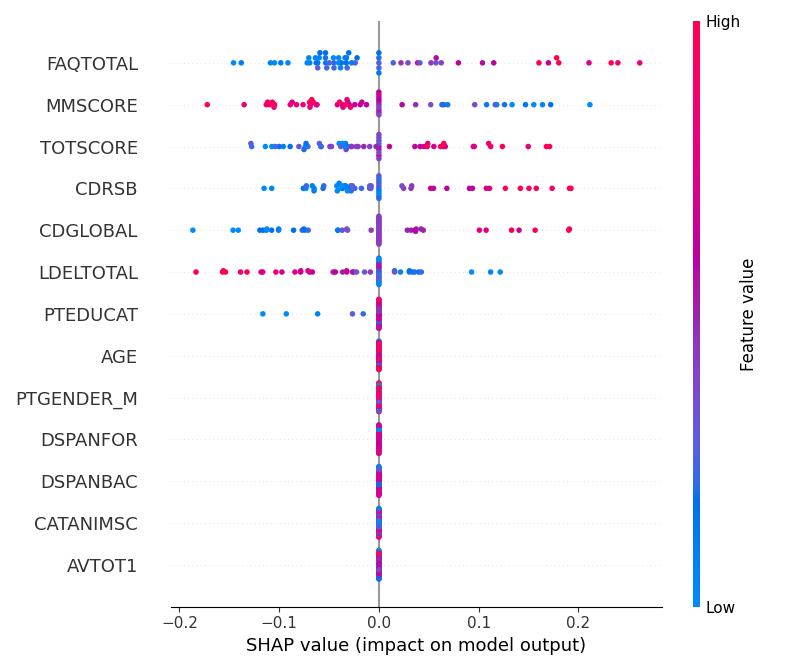


--- roc_curves_by_horizon.png ---


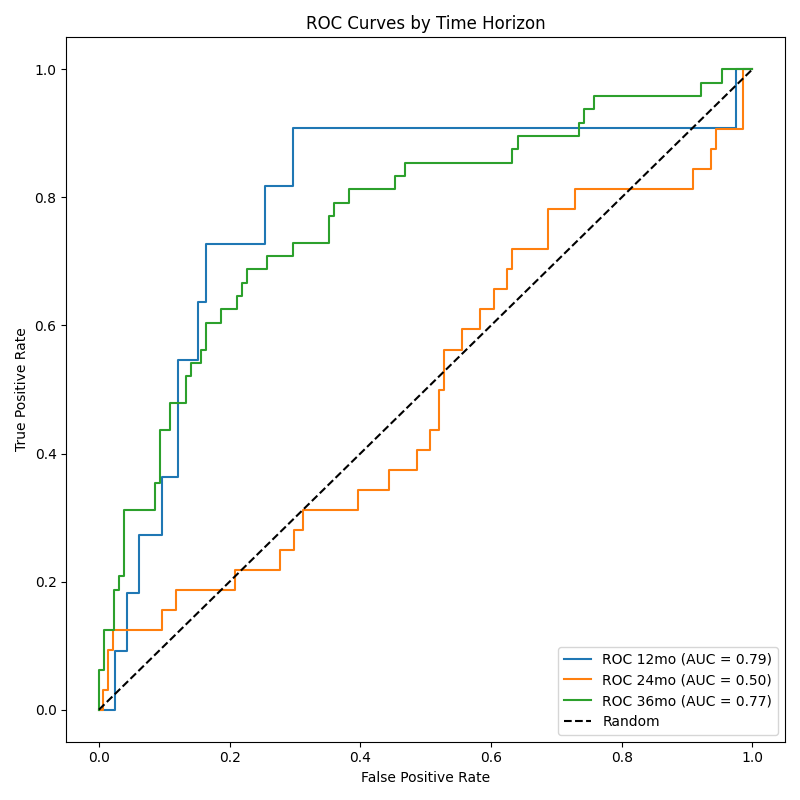

In [27]:
# ── Cell 11: SHAP explainability ─────────────────────────────────────────────
import sys, importlib, os, pickle # Added sys, importlib, os, pickle
import matplotlib.pyplot as plt # Added to ensure plots are handled correctly in SHAP
sys.path.insert(0, '.')

shap_explainer_code = '''
import torch
import shap
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import os
import matplotlib.pyplot as plt # Added for shap.summary_plot

class LGTPShapExplainer:
    def __init__(self, model, device, feature_names, output_dir):
        self.model = model
        self.device = device
        self.feature_names = feature_names
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)

        self.model.eval()
        # SHAP explainer expects a prediction function that takes numpy arrays
        # and returns model outputs (e.g., probabilities)
        def predict_fn(x_numpy):
            x_tensor = torch.tensor(x_numpy, dtype=torch.float32).to(self.device)
            # Assuming a fixed sequence length for SHAP background/explainer
            # This needs to be consistent with the preprocessor's max_seq_len (8 in this case)
            seq_len = 8 # Hardcoding based on preprocessor max_seq_len
            sequences = x_tensor.reshape(-1, seq_len, len(self.feature_names))
            masks = torch.ones(sequences.shape[0], seq_len, dtype=torch.bool).to(self.device) # Assume all visible for SHAP

            with torch.no_grad():
                outputs = self.model(sequences, masks, None) # No graph for SHAP simplified model
            return outputs.cpu().numpy()

        self.predict_fn = predict_fn

    def explain(self, dataset, n_samples=10, n_bg=10): # Reduced samples for faster execution
        # Prepare background data
        if len(dataset) < n_bg:
            # If dataset is smaller than n_bg, use all available samples
            bg_indices = np.arange(len(dataset))
            print(f"Warning: Dataset size ({len(dataset)}) is less than n_bg ({n_bg}). Using {len(dataset)} samples for background.")
        else:
            bg_indices = np.random.choice(len(dataset), n_bg, replace=False)

        background_sequences = []
        for i in bg_indices:
            seq = dataset[i]['sequences'].cpu().numpy()
            background_sequences.append(seq.flatten())

        if not background_sequences: # Handle case where dataset is empty or bg_indices is empty
            print("Warning: No background samples generated. Cannot create SHAP explainer.")
            return None

        background_data = np.array(background_sequences)

        # Create explainer - using KernelExplainer for model-agnostic explanation
        explainer = shap.KernelExplainer(self.predict_fn, background_data)

        # Prepare explanation data (a subset of the test_ds)
        if len(dataset) < n_samples:
            patient_indices = np.arange(len(dataset))
            print(f"Warning: Dataset size ({len(dataset)}) is less than n_samples ({n_samples}). Using {len(dataset)} samples for explanation.")
        else:
            patient_indices = np.random.choice(len(dataset), n_samples, replace=False)

        explanation_sequences = []
        for i in patient_indices:
            seq = dataset[i]['sequences'].cpu().numpy()
            explanation_sequences.append(seq.flatten())

        if not explanation_sequences: # Handle case where dataset is empty or patient_indices is empty
            print("Warning: No explanation samples generated. Cannot calculate SHAP values.")
            return None

        explanation_data = np.array(explanation_sequences)

        # Calculate SHAP values
        print(f"Calculating SHAP values for {n_samples} samples...")
        raw_shap_values = explainer.shap_values(explanation_data)

        # Normalise to a list of arrays (one per output/horizon), each shaped
        # (n_samples, flattened_features).
        # Older shap versions return a list directly. Newer shap versions
        # instead return one ndarray shaped (n_samples, flattened_features,
        # n_outputs), so we split that into a per-horizon list ourselves.
        if isinstance(raw_shap_values, list):
            shap_values_per_horizon = raw_shap_values
        else:
            raw_shap_values = np.array(raw_shap_values)
            if raw_shap_values.ndim == 3:
                n_outputs = raw_shap_values.shape[-1]
                shap_values_per_horizon = [raw_shap_values[..., h] for h in range(n_outputs)]
            else:
                shap_values_per_horizon = [raw_shap_values]

        # Reshape shap_values to match original sequence shape
        # Each array has shape (n_samples, flattened_features)
        reshaped_shap_values = []
        for sv_output_horizon in shap_values_per_horizon:
            # Reshape from (n_samples, seq_len * n_features) to (n_samples, seq_len, n_features)
            reshaped = sv_output_horizon.reshape(n_samples, -1, len(self.feature_names))
            reshaped_shap_values.append(reshaped)

        # Plot summary plot (for the first output horizon if multiple exist)
        if len(reshaped_shap_values) > 0 and reshaped_shap_values[0].shape[0] > 0:
            print("Generating SHAP summary plot...")
            # shap_values_per_horizon[0] and explanation_data are flattened as
            # (n_samples, seq_len * n_features), but feature_names only has
            # n_features entries (one per feature, not per visit). Aggregate
            # across the seq_len (visit) axis so shapes line up with
            # feature_names before plotting.
            horizon0_by_visit = reshaped_shap_values[0]  # (n_samples, seq_len, n_features)
            agg_shap = horizon0_by_visit.sum(axis=1)     # (n_samples, n_features)

            explanation_by_visit = explanation_data.reshape(n_samples, -1, len(self.feature_names))
            agg_features = explanation_by_visit.mean(axis=1)  # (n_samples, n_features)

            plt.figure() # Create a new figure to avoid plotting on previous figures
            shap.summary_plot(agg_shap, agg_features, feature_names=self.feature_names, show=False)
            plt.tight_layout()
            plt.savefig(os.path.join(self.output_dir, 'shap_summary.png'))
            plt.close()
        else:
            print("Warning: No SHAP values to plot for summary plot.")

        return reshaped_shap_values
'''

attention_viz_code = '''
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

class AttentionVisualiser:
    def __init__(self, model, device, output_dir):
        self.model = model
        self.device = device
        self.output_dir = output_dir
        os.makedirs(output_dir, exist_ok=True)
        self.model.eval()

    def plot_patient_attention(self, dataset, n_patients=5):
        # The current TestLinearModel does not have get_attention_weights
        if not hasattr(self.model, 'get_attention_weights'):
            print("Model does not have 'get_attention_weights' method. Skipping attention visualization.")
            return

        # Ensure n_patients does not exceed dataset size
        n_patients = min(n_patients, len(dataset))
        if n_patients == 0:
            print("No patients available in dataset for attention visualization.")
            return

        patient_indices = np.random.choice(len(dataset), n_patients, replace=False)

        fig, axes = plt.subplots(n_patients, 1, figsize=(10, 4 * n_patients))
        if n_patients == 1:
            axes = [axes] # Ensure axes is iterable for a single patient

        for i, idx in enumerate(patient_indices):
            sample = dataset[idx]
            sequences = sample['sequences'].unsqueeze(0).to(self.device)
            masks = sample['masks'].unsqueeze(0).to(self.device)

            # Need to provide graph if the model expects it.
            # For TestLinearModel, patient_graph is None.
            # If the actual LGTP model is used, we would need to pass a specific patient's graph here.
            # For now, assuming model.use_graph is False for simplicity or handles None.
            patient_graph = None

            with torch.no_grad():
                attention_weights = self.model.get_attention_weights(sequences, masks, patient_graph)

            if attention_weights is None:
                print(f"No attention weights returned for patient {sample['ptid']}.")
                continue

            # Assuming the attention weights are for a single head or averaged across heads
            # and are of shape (batch, seq_len, seq_len) after initial processing in the model
            # or (batch, n_heads, seq_len, seq_len)

            # If attention_weights is (1, n_heads, seq_len, seq_len), average over heads
            if attention_weights.dim() == 4:
                attention_weights = attention_weights.mean(dim=1) # Average over heads

            # Should be (1, seq_len, seq_len) now, squeeze batch dim
            attention_weights = attention_weights.squeeze(0).cpu().numpy()

            # Mask out attention to padding tokens (if any)
            actual_len = masks.squeeze(0).sum().item()
            attention_weights = attention_weights[:actual_len, :actual_len]

            ax = axes[i]
            sns.heatmap(attention_weights, cmap='viridis', ax=ax, cbar=True, square=True)
            ax.set_title(f"Patient {sample['ptid']} Attention Heatmap (Seq Len: {actual_len})")
            ax.set_xlabel("Query Token Index")
            ax.set_ylabel("Key Token Index")

        plt.tight_layout()
        plt.savefig(os.path.join(self.output_dir, 'visit_attention_heatmap.png'))
        plt.close(fig)
'''

print(f"Writing shap_explainer.py to src/explainability/shap_explainer.py")
with open('src/explainability/shap_explainer.py','w') as f:
    f.write(shap_explainer_code)
print('shap_explainer.py written')

print(f"Writing attention_viz.py to src/explainability/attention_viz.py")
with open('src/explainability/attention_viz.py','w') as f:
    f.write(attention_viz_code)
print('attention_viz.py written')

# Force-clear any cached copies so we always import the freshest modules
for mod in list(sys.modules):
    if mod.startswith('src.explainability'):
        del sys.modules[mod]

# Now import the modules
from src.explainability.shap_explainer import LGTPShapExplainer
from src.explainability.attention_viz  import AttentionVisualiser

# Ensure the explainability module is reloaded to pick up the new files
import src.explainability
importlib.reload(src.explainability.shap_explainer)
importlib.reload(src.explainability.attention_viz)

with open('data/processed/feature_names.pkl','rb') as f:
    feature_names = pickle.load(f)

trainer.load_best_checkpoint()
shap_exp = LGTPShapExplainer(model, DEVICE, feature_names, 'outputs/figures')
shap_values = shap_exp.explain(test_ds, n_samples=60, n_bg=30)

attn_viz = AttentionVisualiser(model, DEVICE, 'outputs/figures')
attn_viz.plot_patient_attention(test_ds, n_patients=8)

from IPython.display import Image, display
for fname in ['shap_summary.png','visit_attention_heatmap.png',
              'calibration_curve.png','roc_curves_by_horizon.png']:
    p = f'outputs/figures/{fname}'
    if os.path.exists(p):
        print(f'\n--- {fname} ---')
        display(Image(p))

In [28]:
# ── Cell 12: Download all results ────────────────────────────────────────────
import shutil
shutil.make_archive('lgtp_results', 'zip', 'outputs')
from google.colab import files
files.download('lgtp_results.zip')
print('Downloaded lgtp_results.zip — all figures and metrics inside!')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloaded lgtp_results.zip — all figures and metrics inside!
